# COVID Explortory Data Analysis (EDA)

In [1]:
import os
import cdsapi

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotnine as p9
import seaborn as sns

from utils import GetCOVID_Dataset
from utils import GetVariants
from utils import ClimateDataProcessor

Key '-3454192875473727128' not in persistent cache.
Key '-7519539684081744853' not in persistent cache.
Key '-4254707582083186547' not in persistent cache.
Key '3644376726317004937' not in persistent cache.
Key '-735638067535302278' not in persistent cache.
Key '7163446240864889206' not in persistent cache.
Key '3913889988453333062' not in persistent cache.
Key '-151456820154684663' not in persistent cache.
Key '3113375281843873643' not in persistent cache.
Key '-3035927100481118361' not in persistent cache.
Key '-413584492243098913' not in persistent cache.
Key '483142414066765908' not in persistent cache.
Key '-3494768176318429096' not in persistent cache.
Key '-514085696291589996' not in persistent cache.
Key '-4295282882927888515' not in persistent cache.
Key '-7796913359602391822' not in persistent cache.
Key '-776213368380004246' not in persistent cache.
Key '7122870940020187238' not in persistent cache.
Key '7973727654845657144' not in persistent cache.
Key '-6526691740687798832

# Collecting Data

## COVID-19

First let's fetch COVID-19 daily cases from the Our World in Data Repository (OWD) using the GetCOVID_Dataset() function. This will retrieve data starting from *February 2020* up until *March 2024*.


In [3]:
# This will fetch the data, preprocess it and save it in '../data/owd/covid19_world.csv'
GetCOVID_Dataset()
covid_df = pd.read_csv('../data/owd/covid19_world.csv')

Let's take a glance at how the first 10 days look for USA after surpassing the 100 confirmed COVID-19 cases (recall that new cases and new dates have been smoothed) :

In [4]:
covid_df.query('iso3 == "USA" & total_cases >= 100').head(10)

,date,continent,country,iso3,new_cases,total_cases,new_deaths,total_deaths,new_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,population,population_density,total_vaccinations
327657,2020-03-04,North America,United States,USA,26.632653,105.714286,1.183673,3.081633,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
327658,2020-03-05,North America,United States,USA,33.938776,139.653061,1.530612,4.612245,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
327659,2020-03-06,North America,United States,USA,41.244898,180.897959,1.877551,6.489796,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
327660,2020-03-07,North America,United States,USA,48.551020,229.448980,2.224490,8.714286,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
327661,2020-03-08,North America,United States,USA,55.857143,285.306122,2.571429,11.285714,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
327662,2020-03-09,North America,United States,USA,118.591837,403.897959,3.224490,14.510204,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
327663,2020-03-10,North America,United States,USA,181.326531,585.224490,3.877551,18.387755,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
327664,2020-03-11,North America,United States,USA,244.061224,829.285714,4.530612,22.918367,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
327665,2020-03-12,North America,United States,USA,306.795918,1136.081633,5.183673,28.102041,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
327666,2020-03-13,North America,United States,USA,369.530612,1505.612245,5.836735,33.938776,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0


Additionally, we'll retrieve data on various COVID variants from GISAID, representing the number of analyzed sequences in the preceding week corresponding to each variant group. This data will be fetched and preprocessed using the GetVariants() function. *(Retrieve data from November 2021 to April 2022)*


In [5]:
# This will fetch the data, preprocess it and save it in '../data/gisaid/variants.csv'
GetVariants()
variants_df = pd.read_csv('../data/gisaid/variants.csv')

Let's take a glance at the structure of this dataset, later on we will deepen into its content:

In [6]:
variants_df.query('country == "Spain"').tail(10)

,country,Week prior to,Type,Value,Submission Count,% per Country and Week,Total per Country and Week
11432,Spain,2021-06-27,Variant,Iota (B.1.526),5,0.002,2026
11433,Spain,2021-06-27,Variant,Eta (B.1.525),4,0.002,2026
11434,Spain,2021-07-04,Variant,Delta (B.1.617.2+AY.*),2076,0.576,3607
11435,Spain,2021-07-04,Variant,Alpha (B.1.1.7+Q.*),878,0.243,3607
11436,Spain,2021-07-04,Variant,Other,465,0.129,3607
11437,Spain,2021-07-04,Variant,Mu (B.1.621+B.1.621.1),68,0.019,3607
11438,Spain,2021-07-04,Variant,Gamma (P.1+P.1.*),57,0.016,3607
11439,Spain,2021-07-04,Variant,Lambda (C.37+C.37.1),36,0.010,3607
11440,Spain,2021-07-04,Variant,Beta (B.1.351+B.1.351.2+B.1.351.3),21,0.006,3607
11441,Spain,2021-07-04,Variant,Eta (B.1.525),6,0.002,3607


## Climate

We are fetching the weather data from the Copernicus Climate Data Store (CDS), which gives us access to (among others) the ERA5 hourly data on single levels from 1979 to present. We download the grid at a 0.5x0.5 degree resolution directly through the API.

For the API calls to work, a client needs to be instantiated which will read the private keys in /home/$USER/.cdsapirc:

In this approach, we've crafted a class ClimateDataProcessor() to streamline the retrieval, preprocessing, and concatenation of data into a unified dataframe.

In [7]:
import pickle

# Create an instance of ClimateDataProcessor
processor = ClimateDataProcessor()

# Call the methods
processor.retrieve_climate_data()
processor.filter_relevant_coordinates()
processor.compute_relative_absolute_humidity()
climate_df, world, country_to_iso = processor.concat_data()

with open('../data/world_shape.pkl', 'wb') as f:
    pickle.dump(world, f)

c:\Users\brand\Desktop\Final Project\code\utils.py:304: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.


The dataset presents latitude and longitude pairs, each corresponding to a specific country. For each pair, there are four daily climate variables recorded:

In [8]:
climate_df

,date,latitude,longitude,country,temperature,absolute_humidity,relative_humidity,total_precipitation,iso3
0,2020-02-01,54.0,0.0,United Kingdom,8.770752,6.679815,0.764551,0.356048,GBR
1,2020-02-02,54.0,0.0,United Kingdom,7.355225,6.827348,0.857069,4.333681,GBR
2,2020-02-03,54.0,0.0,United Kingdom,7.222839,6.035095,0.763738,0.005949,GBR
3,2020-02-04,54.0,0.0,United Kingdom,6.728821,5.937930,0.776210,0.017760,GBR
4,2020-02-05,54.0,0.0,United Kingdom,5.528748,6.286285,0.889887,0.021977,GBR
...,...,...,...,...,...,...,...,...,...
101414191,2024-03-27,5.0,-0.5,Ghana,28.934387,24.500422,0.839253,0.685325,GHA
101414192,2024-03-28,5.0,-0.5,Ghana,29.220398,24.650284,0.830867,1.021050,GHA
101414193,2024-03-29,5.0,-0.5,Ghana,28.587433,24.361784,0.851081,2.819903,GHA
101414194,2024-03-30,5.0,-0.5,Ghana,29.304749,24.243731,0.812957,0.467980,GHA


In [9]:
print('Number of unique countries in CDS Data: ', len(pd.unique(climate_df['country'])))

Number of unique countries in CDS Data:  176


# Figures

## What is the average temperature (°C) in each country?

In [10]:
# Define custom color palette resembling RdBu
custom_palette = ["#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
                  "#f7f7f7", "#fddbc7", "#f4a582", "#d6604d", "#b2182b"]

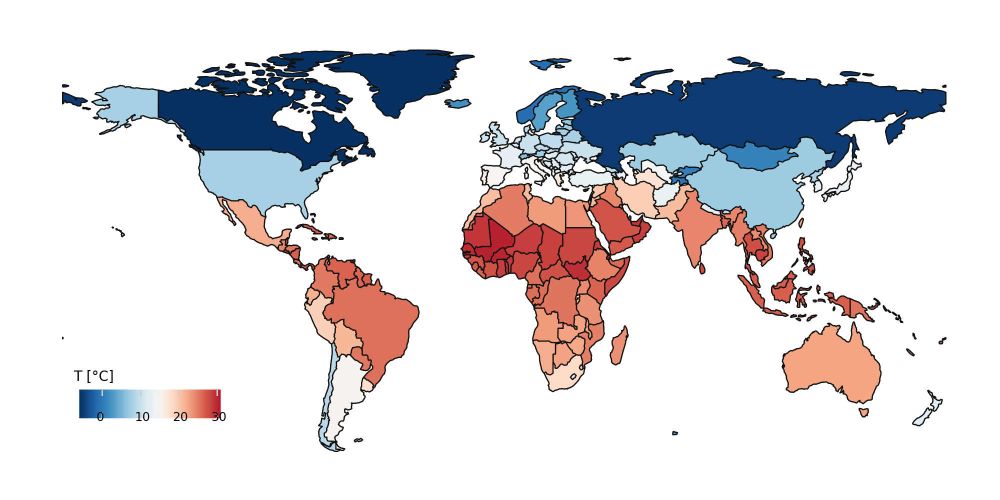

<Figure Size: (1000 x 500)>

In [11]:
f_t = (climate_df
       .groupby('country',as_index=False)
       .mean(numeric_only=True)
       .merge(world)
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='temperature')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_gradientn(colors=custom_palette, limits=(-5, 30))
      + p9.theme_void()
      + p9.labs(fill='T [°C]')
      + p9.theme(figure_size=(10, 5), legend_position=(.15, .20), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')
f_t

## What is the average absolute humidity (g/m³) in each country?

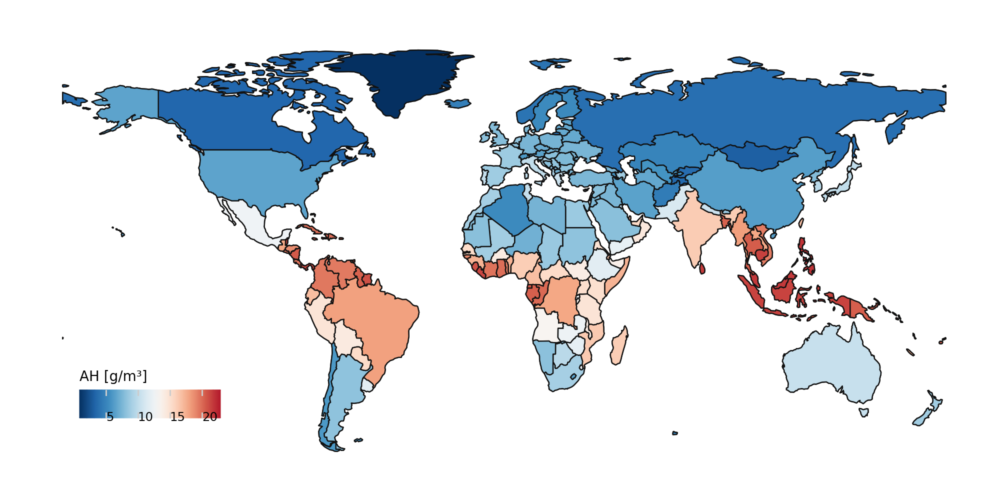

<Figure Size: (1000 x 500)>

In [12]:
f_t = (climate_df
       .groupby('country',as_index=False)
       .mean(numeric_only=True)
       .merge(world)
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='absolute_humidity')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_gradientn(colors=custom_palette)
      + p9.theme_void()
      + p9.labs(fill='AH [g/m³]')
      + p9.theme(figure_size=(10, 5), legend_position=(.15, .20), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')
f_t

## What is the daily number of confirmed cases?

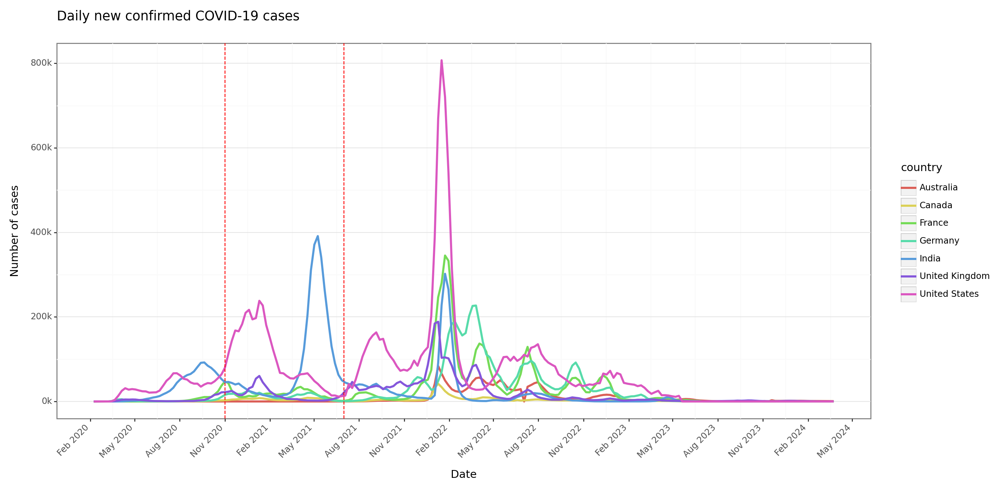

<Figure Size: (1400 x 700)>

In [13]:
# Define subset of countries
subset_countries = ['United States','France', 'Canada','Germany', 'United Kingdom','India','Australia']
#subset_countries = ['India', 'United States','Indonesia','Pakistan','Nigeria','Brazil','Bangladesh','Russia','Mexico']

# Filter data for the selected countries
subset_data = covid_df[covid_df['country'].isin(subset_countries)].copy()
subset_data.loc[:,'date'] = pd.to_datetime(subset_data['date'])


# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='new_cases', group='country', color='country')
       + p9.geom_line(size=1.2)
       + p9.geom_vline(xintercept=pd.to_datetime('2020-11-01'), linetype='dashed', color='red')
       + p9.geom_vline(xintercept=pd.to_datetime('2021-07-01'), linetype='dashed', color='red')
       + p9.scale_x_datetime(date_breaks='3 months', date_labels='%b %Y')
       + p9.scale_y_continuous(labels=lambda x: ['{:.0f}{}'.format(val / 1000, 'k') if val < 1000000 else '{:.0f}{}'.format(val / 1000000, 'M') for val in x])
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Daily new confirmed COVID-19 cases ', x='Date', y='Number of cases')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

## What is the cumulative number of confirmed cases?

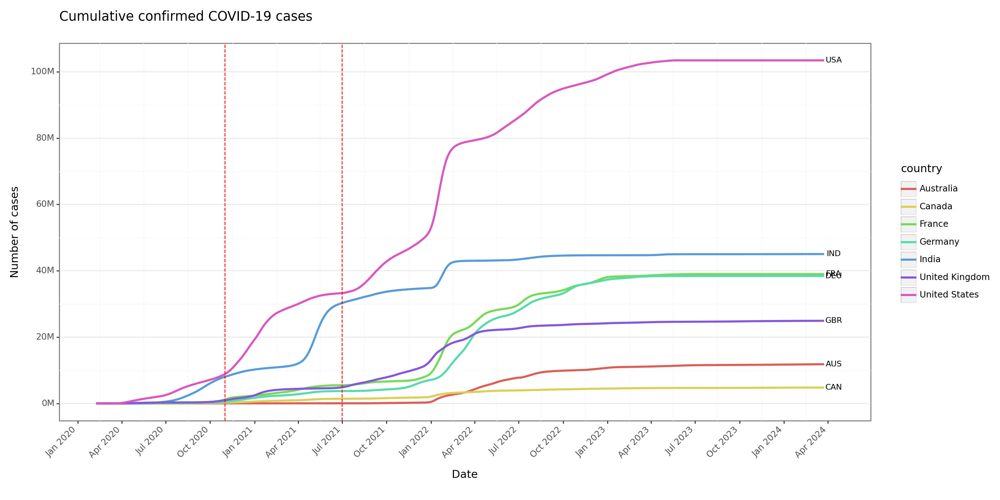

<Figure Size: (1400 x 700)>

In [14]:
# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='total_cases', group='country', color='country')
       + p9.geom_line(size=1.2)
       + p9.geom_vline(xintercept=pd.to_datetime('2020-11-01'), linetype='dashed', color='red')
       + p9.geom_vline(xintercept=pd.to_datetime('2021-07-01'), linetype='dashed', color='red')
       + p9.geom_text(data=subset_data.groupby('country').tail(1), mapping=p9.aes(label='iso3'), nudge_x=20, nudge_y=0, size=8, color='black', show_legend=False)
       + p9.scale_y_continuous(breaks=range(0, int(subset_data['total_cases'].max()) + 20000000, 20000000),
                              labels=lambda x: ['{:.0f}M'.format(val / 1000000) for val in x])
       + p9.scale_x_datetime(date_breaks='3 months', date_labels='%b %Y')
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Cumulative confirmed COVID-19 cases ', x='Date', y='Number of cases')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

## What is the daily number of confirmed deaths?

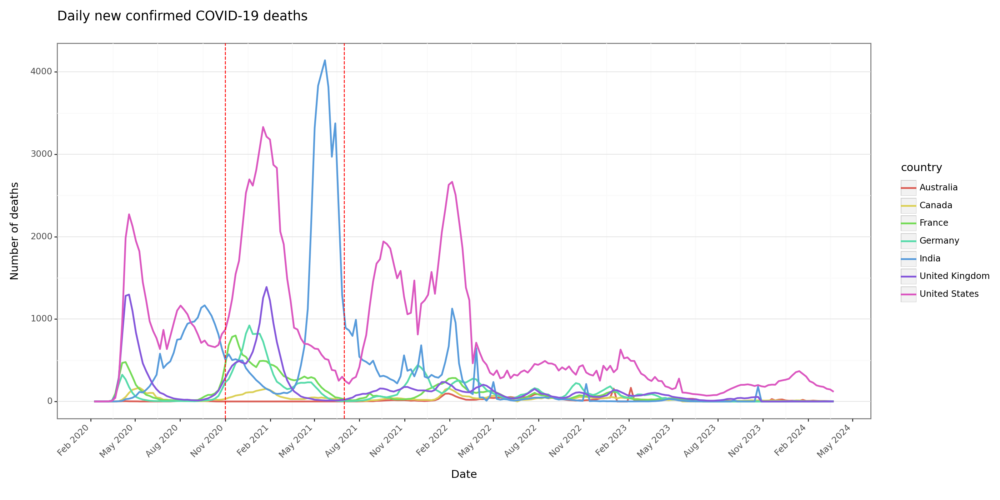

<Figure Size: (1400 x 700)>

In [15]:
# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='new_deaths', group='country', color='country')
       + p9.geom_line(size=1)
       + p9.geom_vline(xintercept=pd.to_datetime('2020-11-01'), linetype='dashed', color='red')
       + p9.geom_vline(xintercept=pd.to_datetime('2021-07-01'), linetype='dashed', color='red')
       + p9.scale_x_datetime(date_breaks='3 months', date_labels='%b %Y')
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Daily new confirmed COVID-19 deaths ', x='Date', y='Number of deaths')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t


## What is the cumulative number of confirmed deaths?

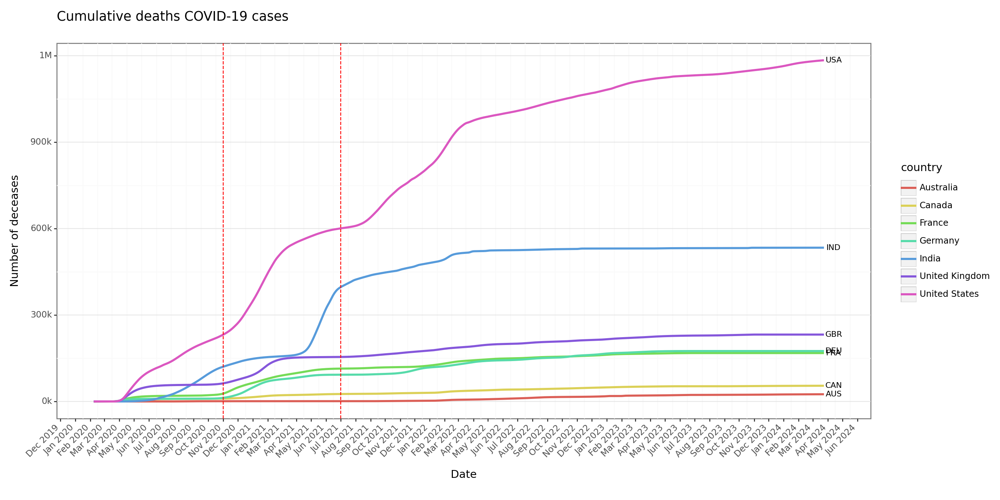

<Figure Size: (1400 x 700)>

In [16]:
# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='total_deaths', group='country', color='country')
       + p9.geom_line(size=1.2)
       + p9.geom_vline(xintercept=pd.to_datetime('2020-11-01'), linetype='dashed', color='red')
       + p9.geom_vline(xintercept=pd.to_datetime('2021-07-01'), linetype='dashed', color='red')
       + p9.geom_text(data=subset_data.groupby('country').tail(1), mapping=p9.aes(label='iso3'), nudge_x=20, nudge_y=0, size=8, color='black', show_legend=False)
       + p9.scale_x_datetime(date_breaks='1 months', date_labels='%b %Y')
       + p9.scale_y_continuous(labels=lambda x: ['{:.0f}{}'.format(val / 1000, 'k') if val < 1000000 else '{:.0f}{}'.format(val / 1000000, 'M') for val in x])
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Cumulative deaths COVID-19 cases ', x='Date', y='Number of deceases')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

## What was the distribution of COVID variants through time?

In [17]:
country_groups = pd.read_csv('../data/country_groups.csv').sort_values('group')
selected_variants_df = variants_df[variants_df['Value'] != 'Other'].merge(country_to_iso)

In [18]:
# Total Submission Count per variant per country
grouped_variants = selected_variants_df.groupby(['country', 'Value'])['Submission Count'].sum().reset_index()

# Total Submission Count, for all variants
country_totals = grouped_variants.groupby('country')['Submission Count'].sum().reset_index()
country_totals.rename(columns={'Submission Count': 'Total Submission Count'}, inplace=True)

# Total Submission Count per variant per country and % per Country
merged_data = pd.merge(grouped_variants, country_totals, on='country')
merged_data['% per Country'] = (merged_data['Submission Count'] / merged_data['Total Submission Count'])

# Most frequent variant per each country
most_concurrent_variants = merged_data.loc[merged_data.groupby('country')['Submission Count'].idxmax()]

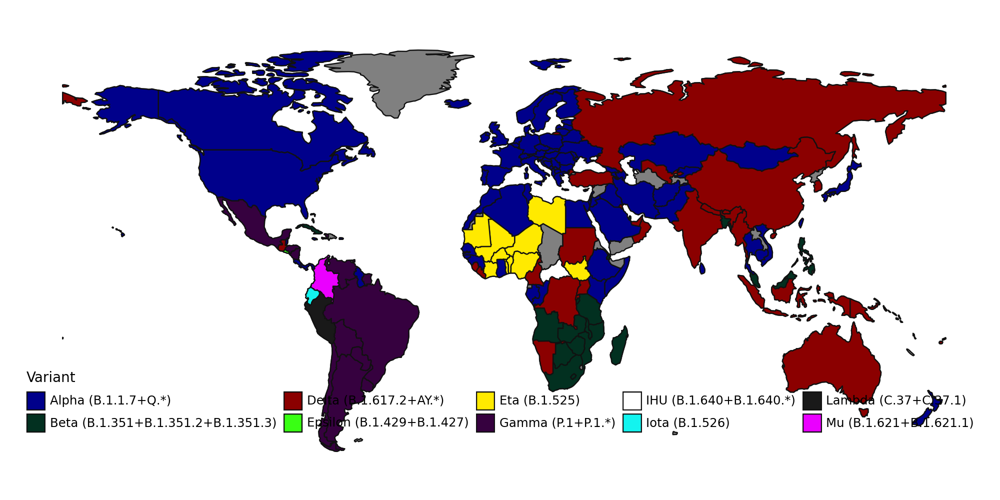

<Figure Size: (1000 x 500)>

In [19]:
# Define the custom color palette for the variants
variant_colors = {
    'Alpha (B.1.1.7+Q.*)': '#00008b',      # dark blue
    'Beta (B.1.351+B.1.351.2+B.1.351.3)': '#023020',  # dark green
    'Delta (B.1.617.2+AY.*)': '#8B0000',   # dark red
    'Gamma (P.1+P.1.*)': '#36013F',        # dark purple
    'Eta (B.1.525)': '#FFEA00',            # yellow
    'Epsilon (B.1.429+B.1.427)': '#39FF14',# neon green
    #'Zeta (P.2)': '#800080',               # dark magenta
    'Iota (B.1.526)': '#13F4EF',           # white-ish light blue
    'IHU (B.1.640+B.1.640.*)': '#FFFFFF',     # white
    'Mu (B.1.621+B.1.621.1)': '#EA00FF',   # magenta
    'Lambda (C.37+C.37.1)': '#191919',     # black
    #'Kappa (B.1.617.1)': '#e7ba52',        # beige
    #'Theta (P.3)': '#17becf'               # teal
    #'Other': 'darkgreen'
}

# Convert the dictionary to a list of colors
custom_palette = list(variant_colors.values())

# Adjust the plot code to color by variants
f_t = (most_concurrent_variants
       .merge(world, on='country')
       .pipe(lambda dd: p9.ggplot(dd) 
             + p9.aes(fill='Value')
             + p9.geom_map(data=world, fill='gray')
             + p9.geom_map()
             + p9.scale_fill_manual(values=variant_colors)
             + p9.theme_void()
             + p9.labs(fill='Variant')
             + p9.theme(figure_size=(10, 5), legend_position=(.5, .20), legend_key_size=14,
                        legend_title=p9.element_text(size=10)))
)

# Save the plot (uncomment to save)
# p9.ggsave(f_t, '../../results/figures/t_map.pdf')

f_t

Processing Estonia in group Baltics


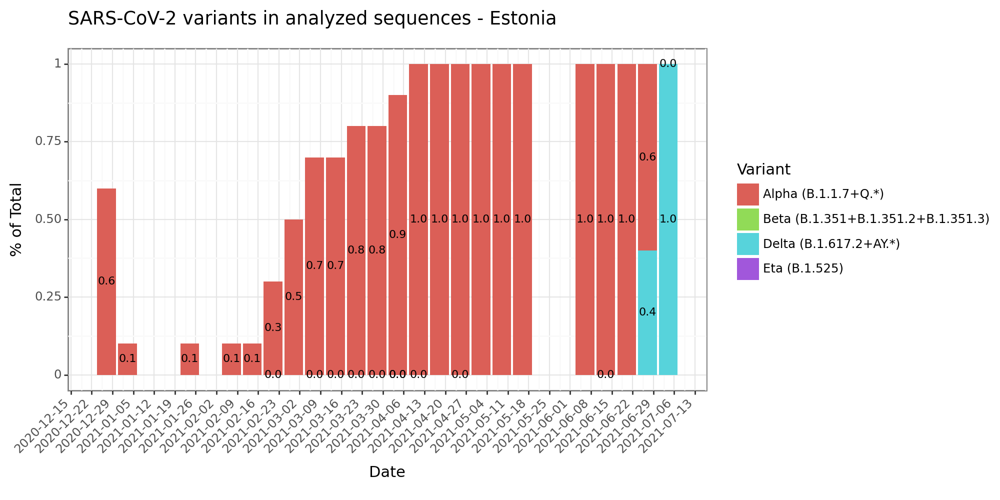


Processing Latvia in group Baltics


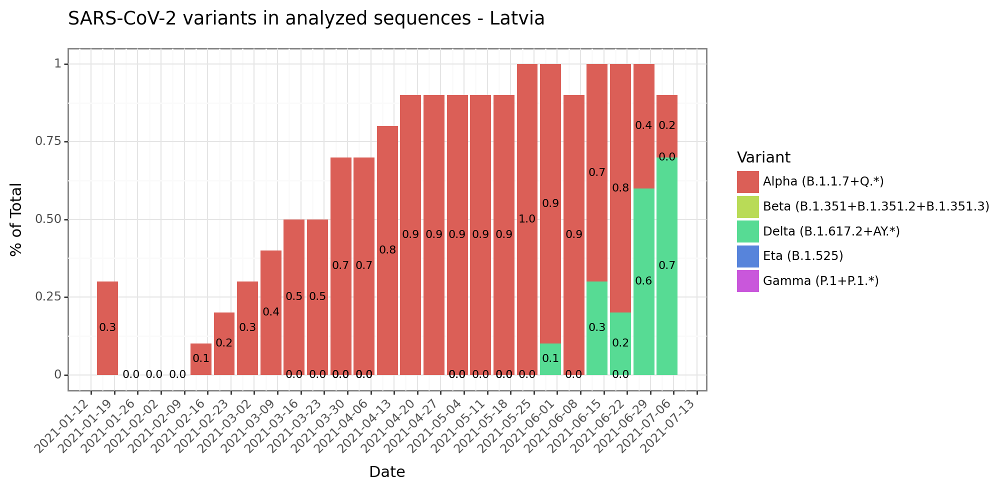


Processing Lithuania in group Baltics


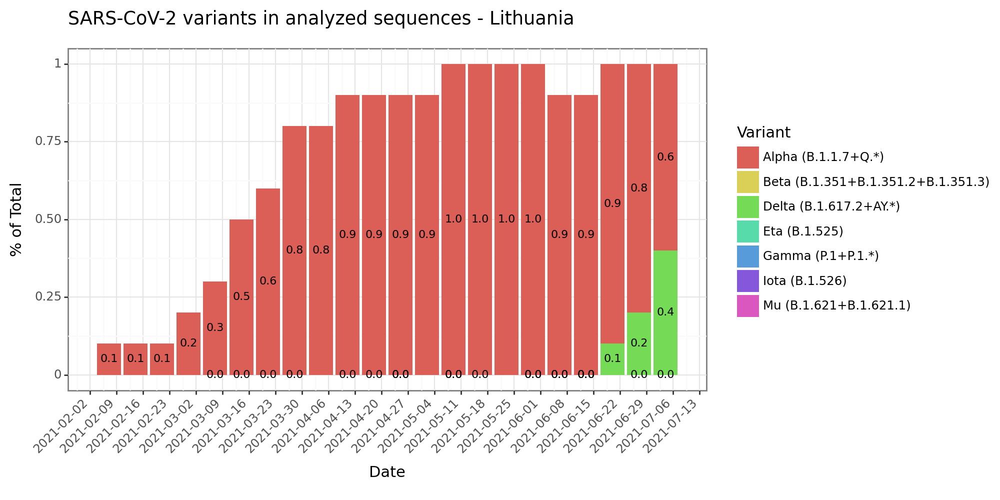


Processing Tanzania in group C. Africa


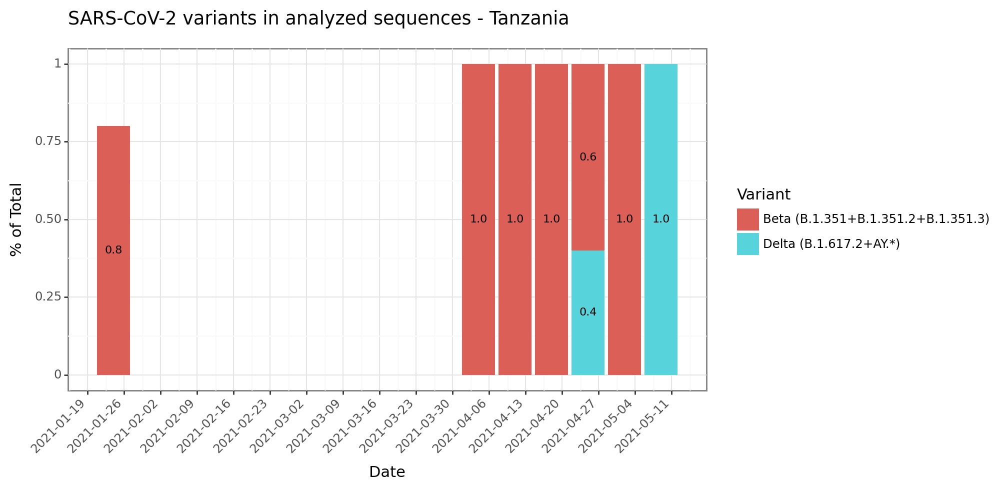


Processing Sierra Leone in group C. Africa


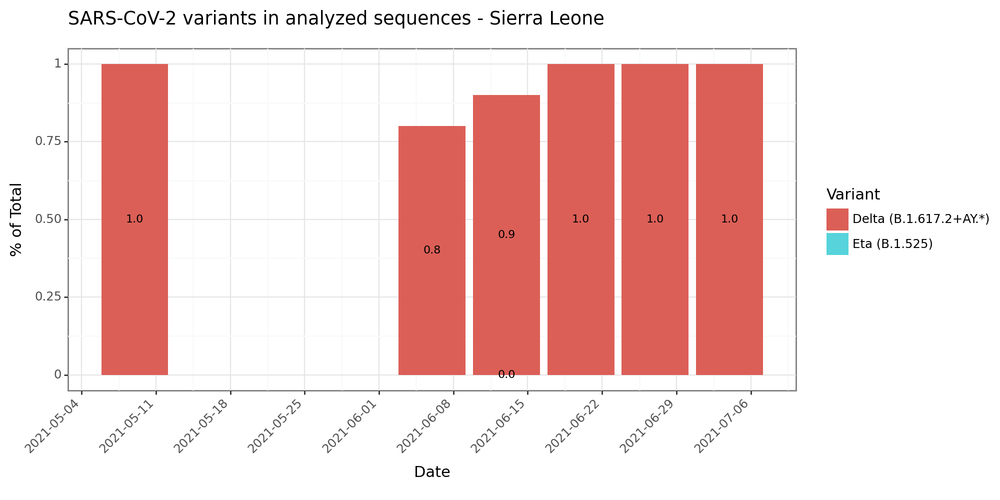


Processing Liberia in group C. Africa


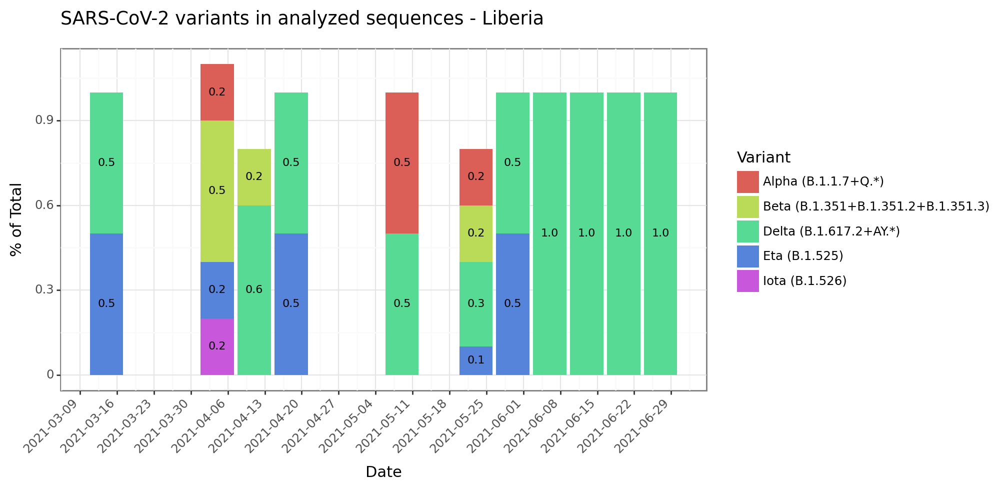


Processing Guinea-Bissau in group C. Africa


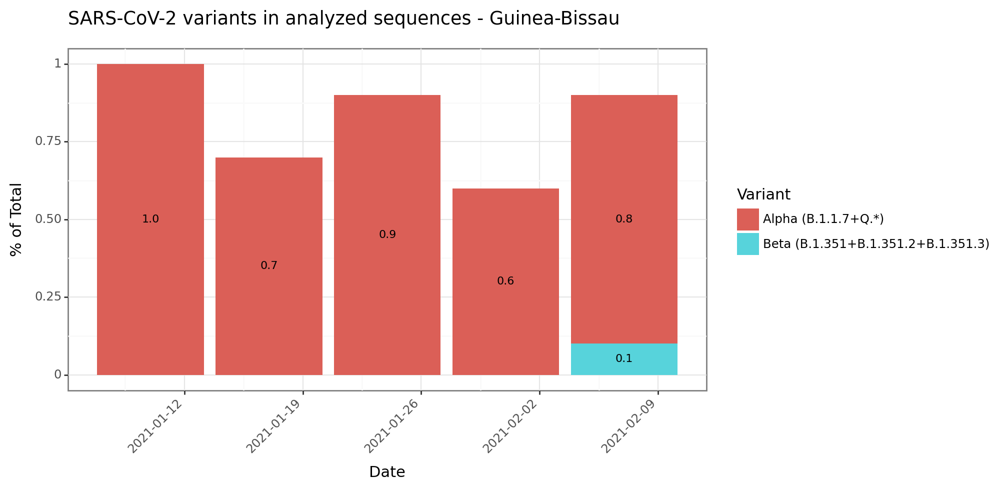


Processing Guinea in group C. Africa


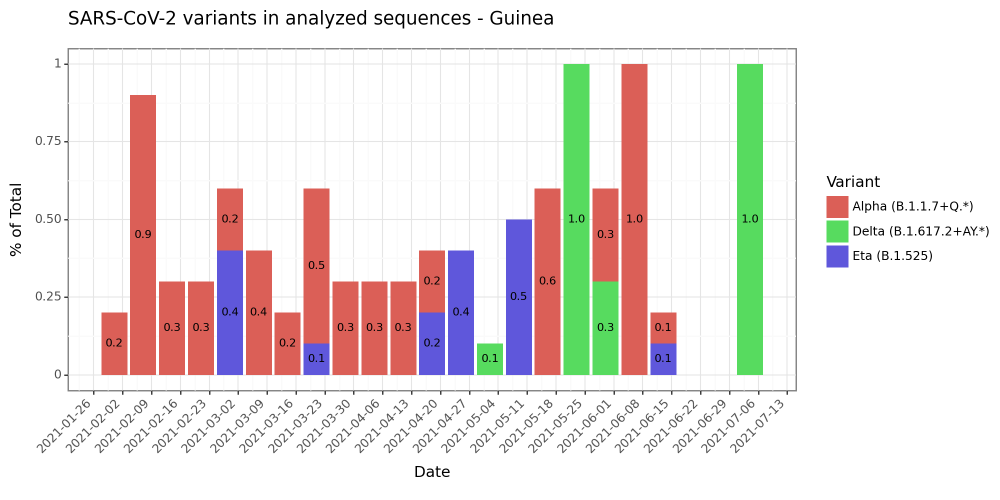


Processing Uganda in group C. Africa


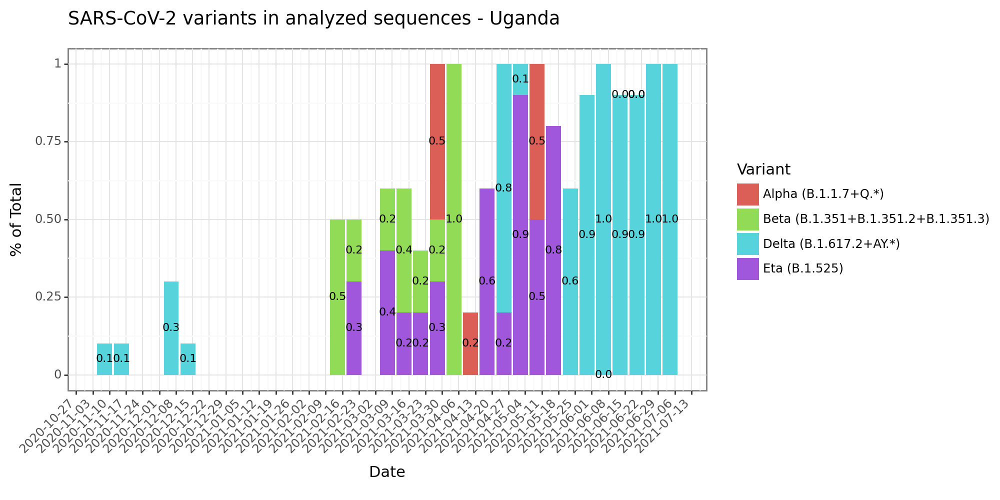


Processing Togo in group C. Africa


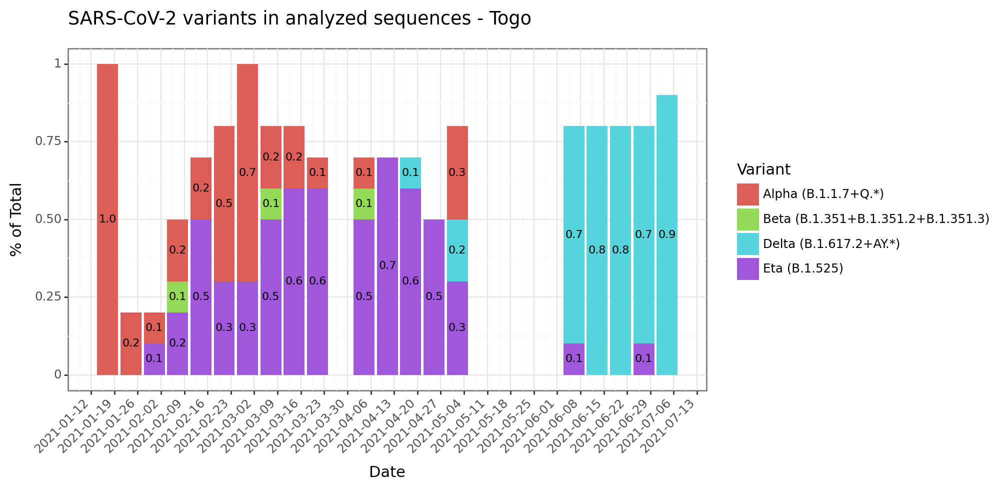


Processing Burkina Faso in group C. Africa


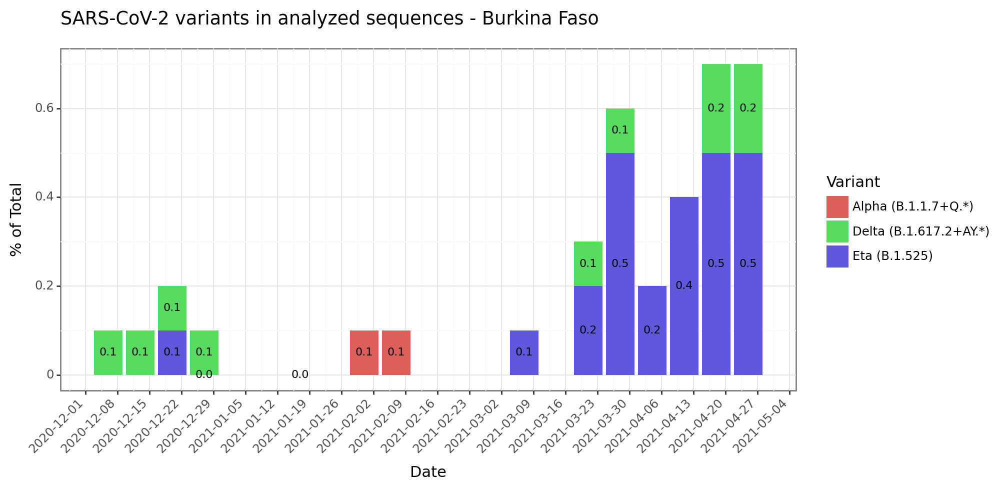


Processing Cameroon in group C. Africa


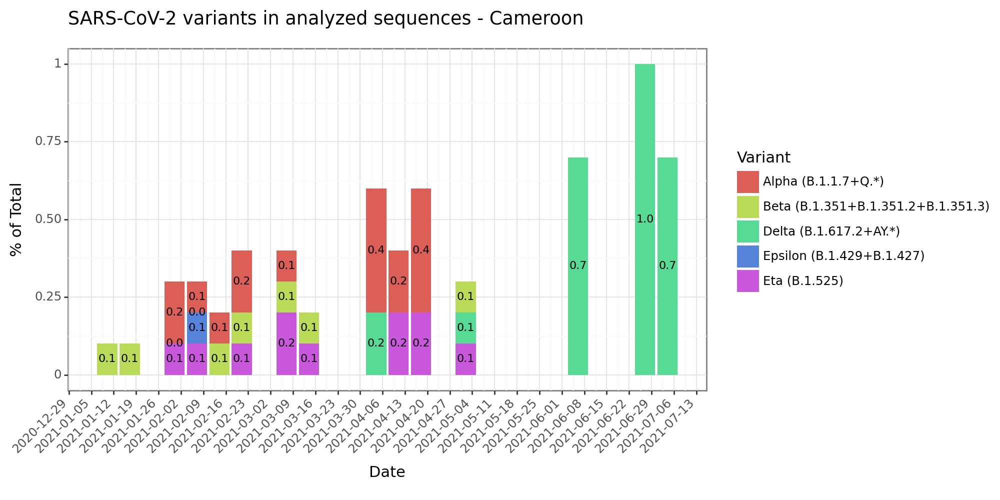


Processing Nigeria in group C. Africa


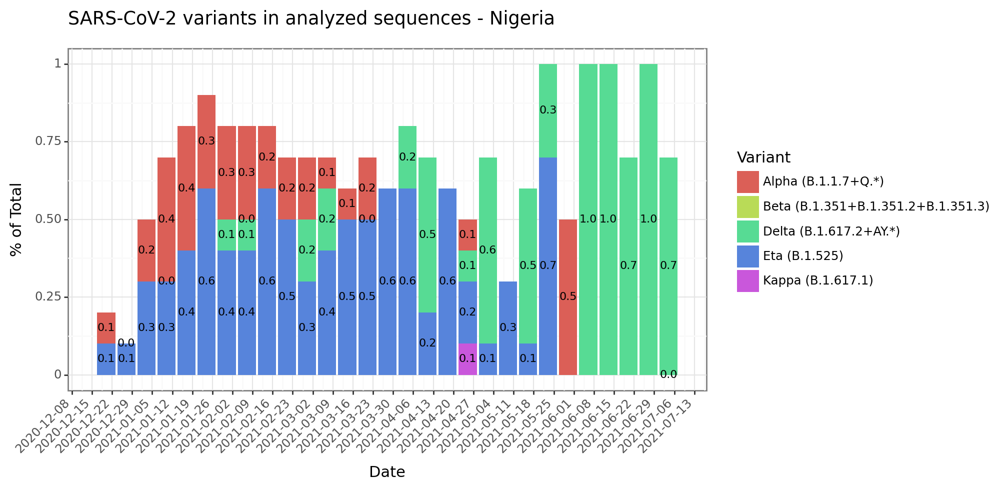


Processing Niger in group C. Africa


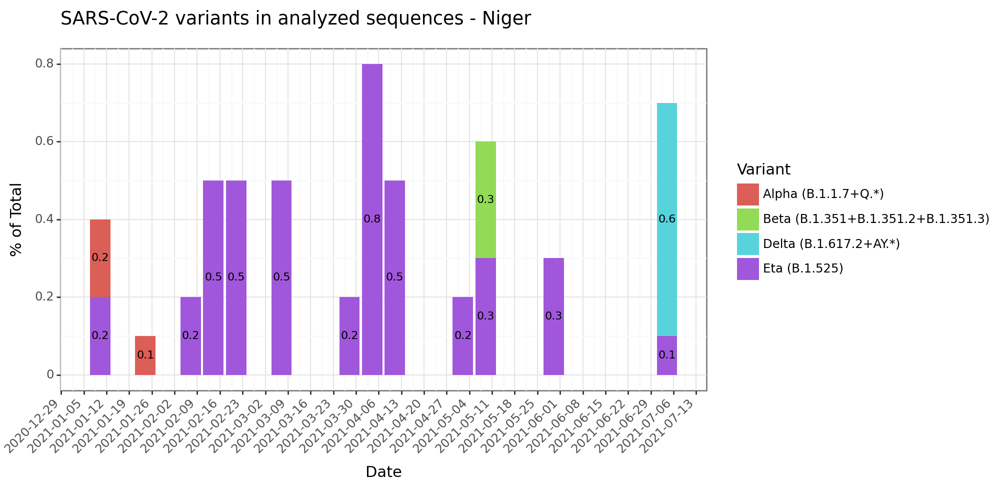


Processing Benin in group C. Africa


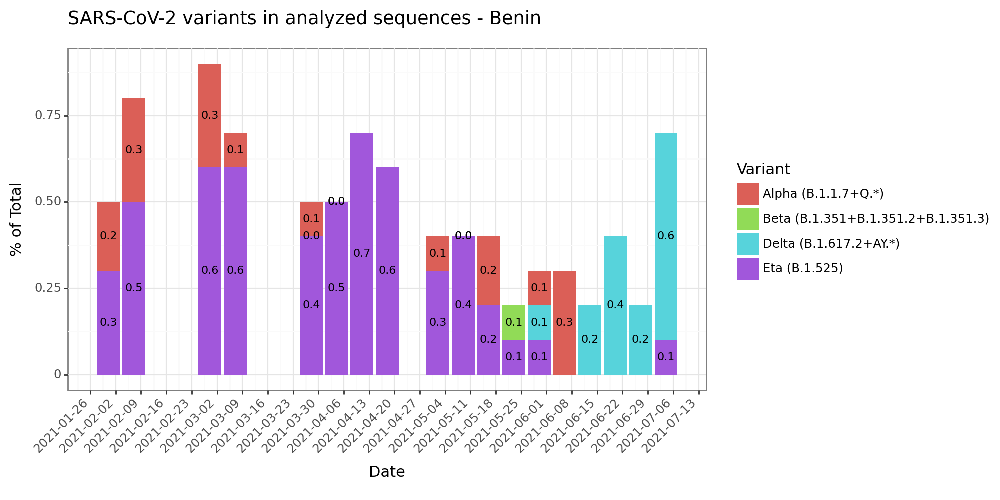


Processing Ghana in group C. Africa


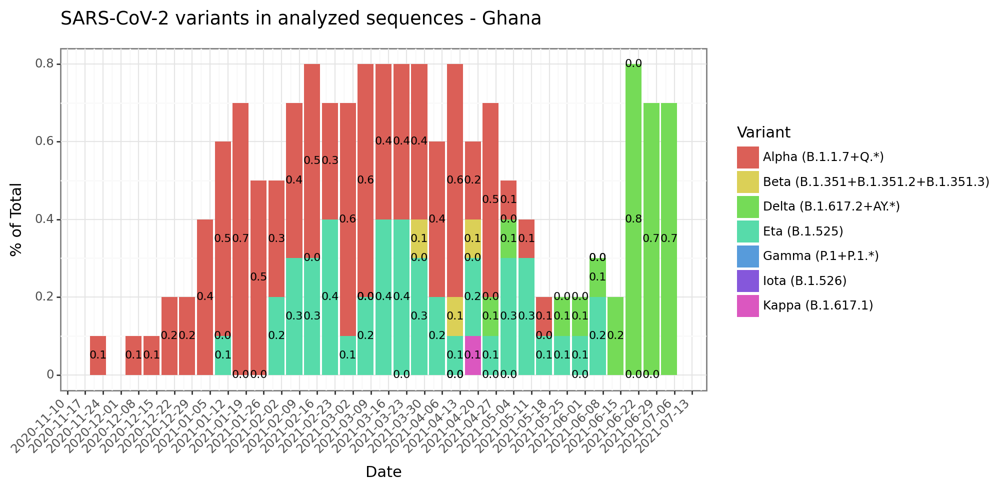


Processing Central African Rep. in group C. Africa


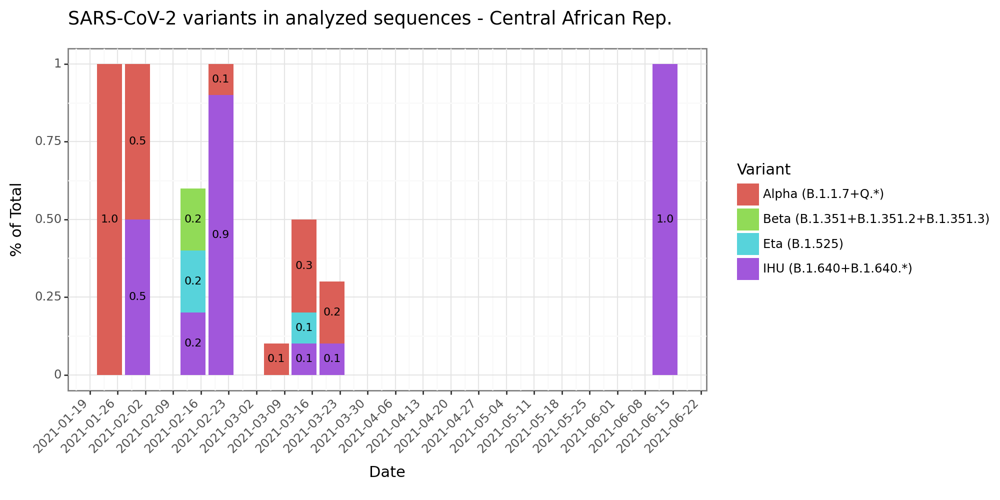


Processing Gabon in group C. Africa


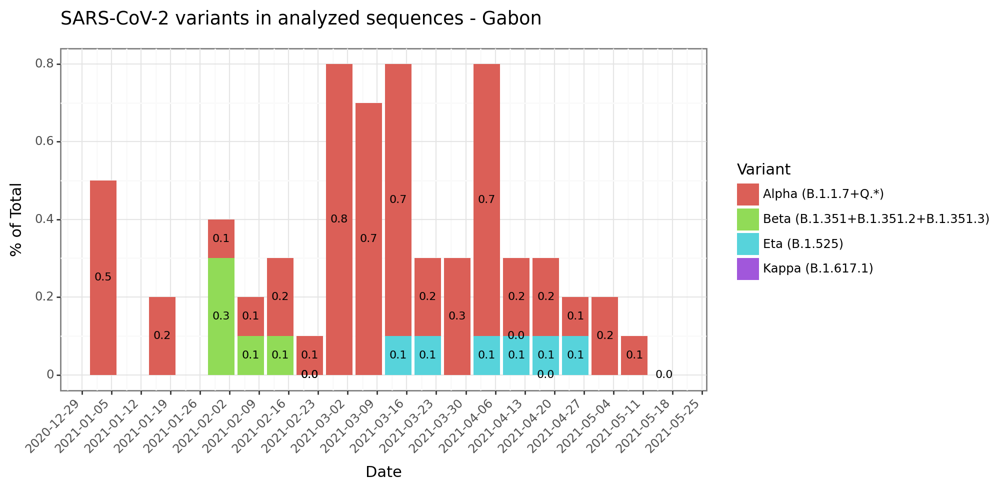


Processing Mauritania in group C. Africa


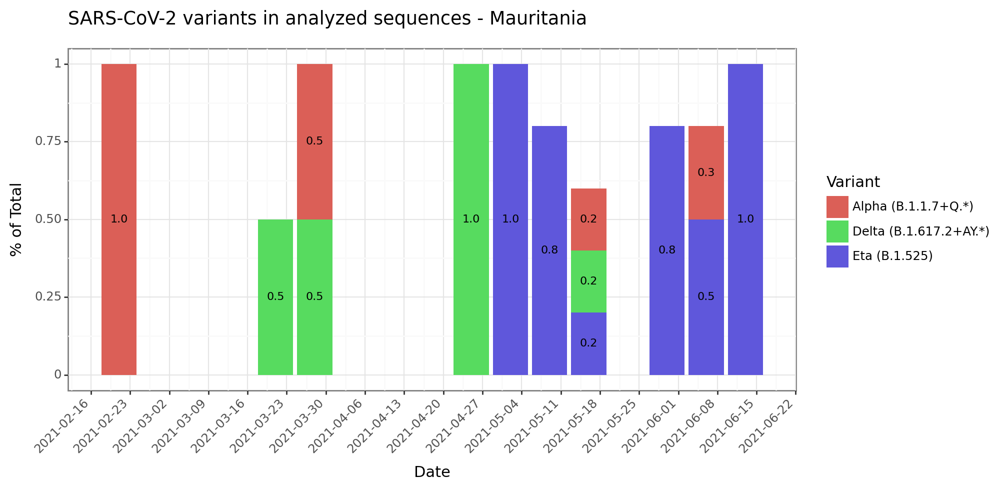


Processing Eq. Guinea in group C. Africa


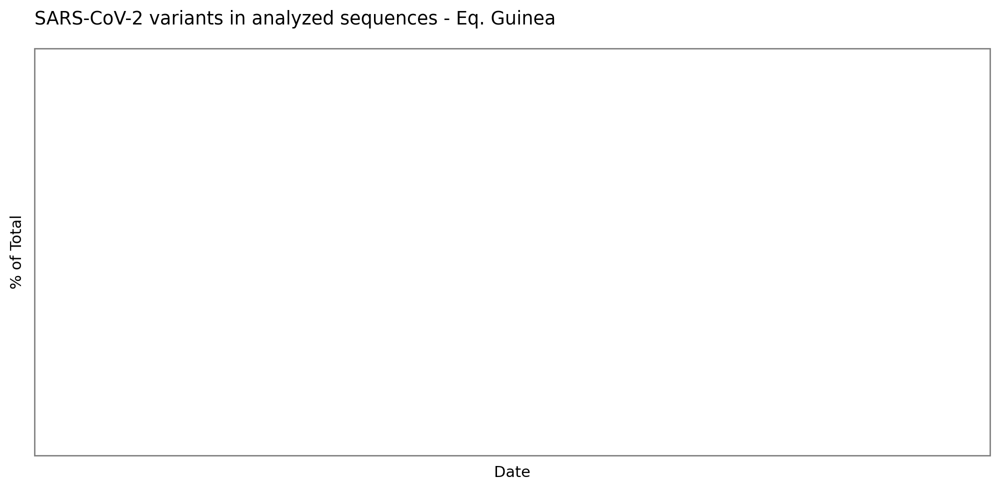


Processing Zambia in group C. Africa


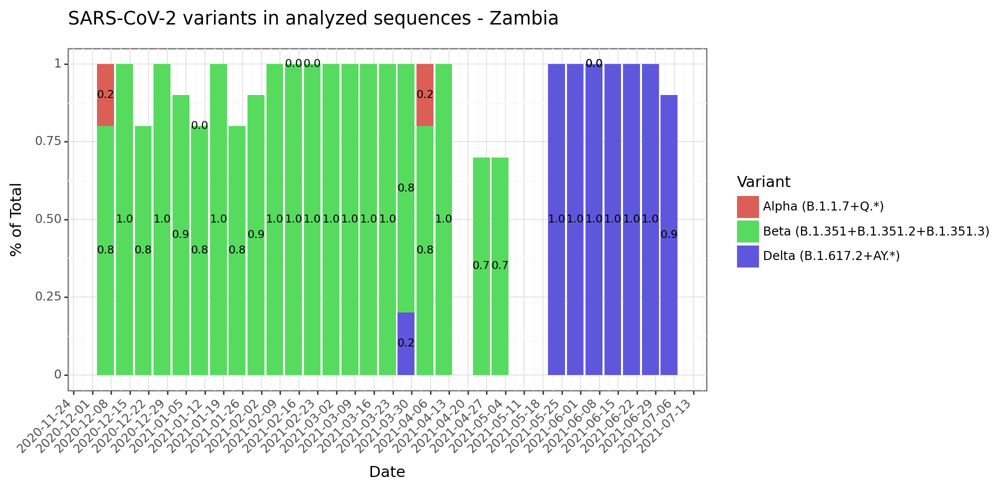


Processing Malawi in group C. Africa


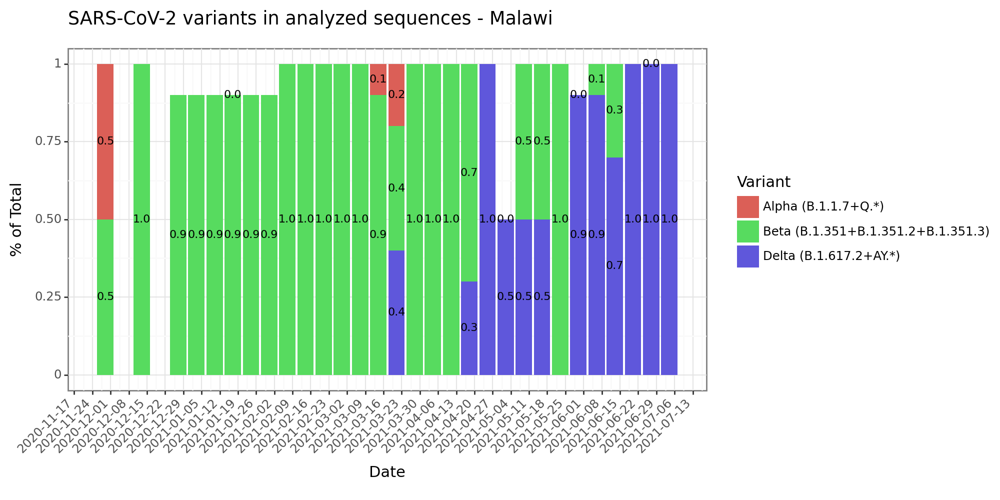


Processing Mozambique in group C. Africa


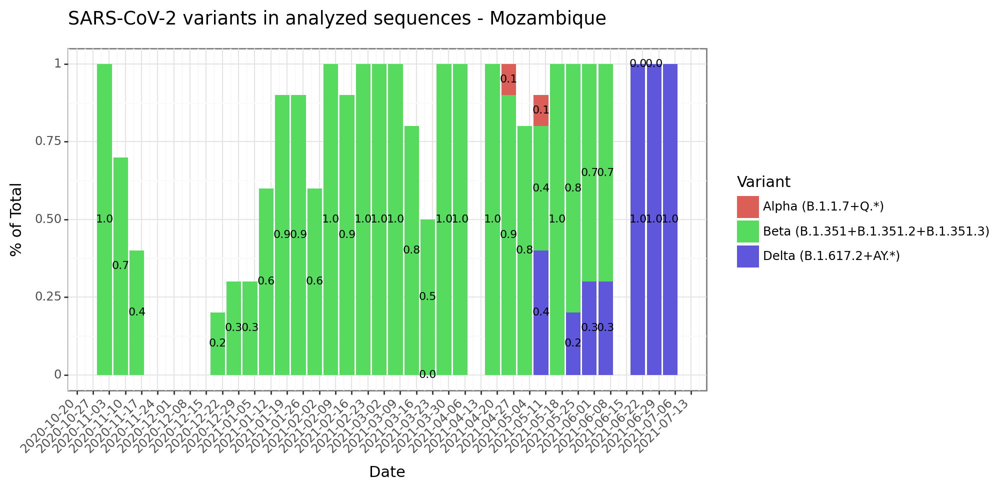


Processing Angola in group C. Africa


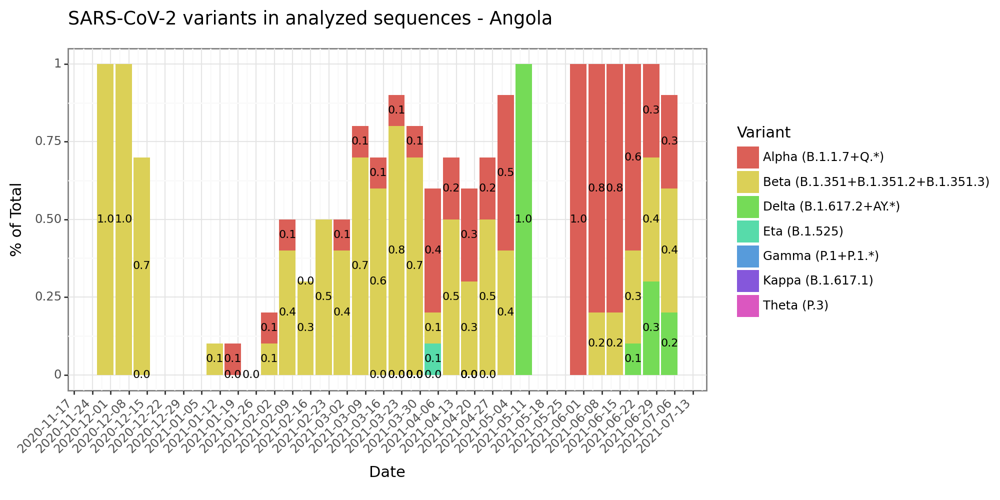


Processing Burundi in group C. Africa


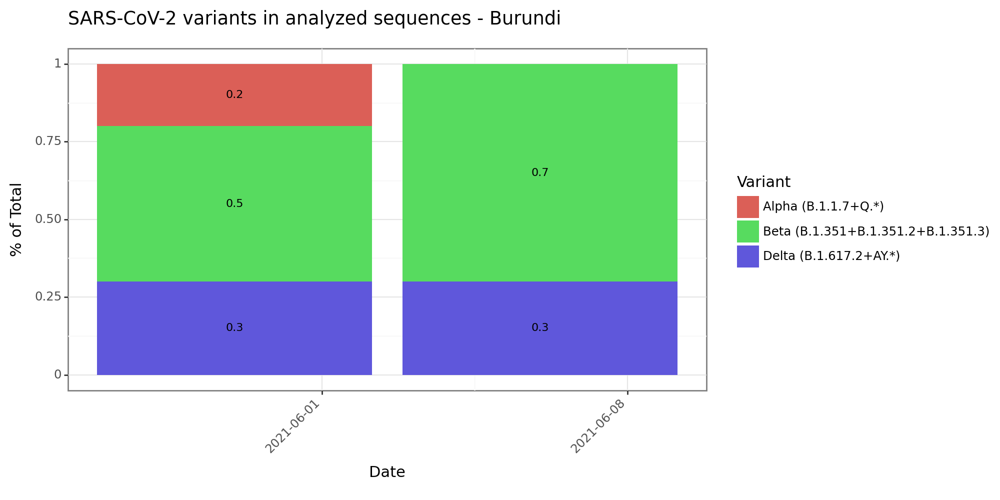


Processing Madagascar in group C. Africa


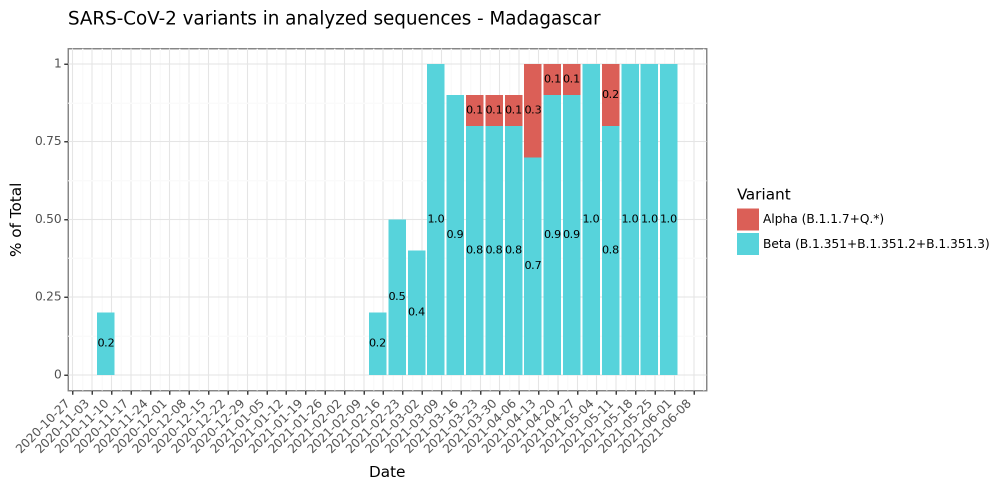


Processing Gambia in group C. Africa


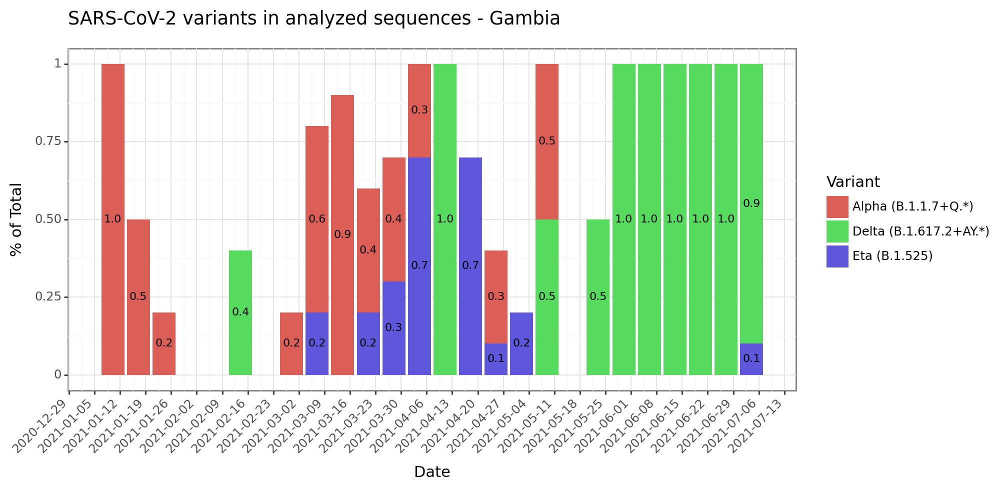


Processing Eritrea in group C. Africa


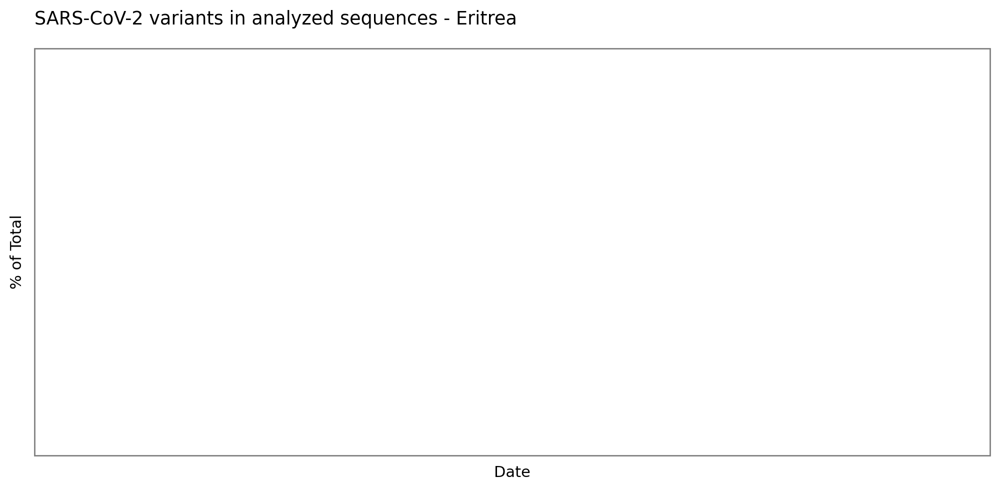


Processing Ethiopia in group C. Africa


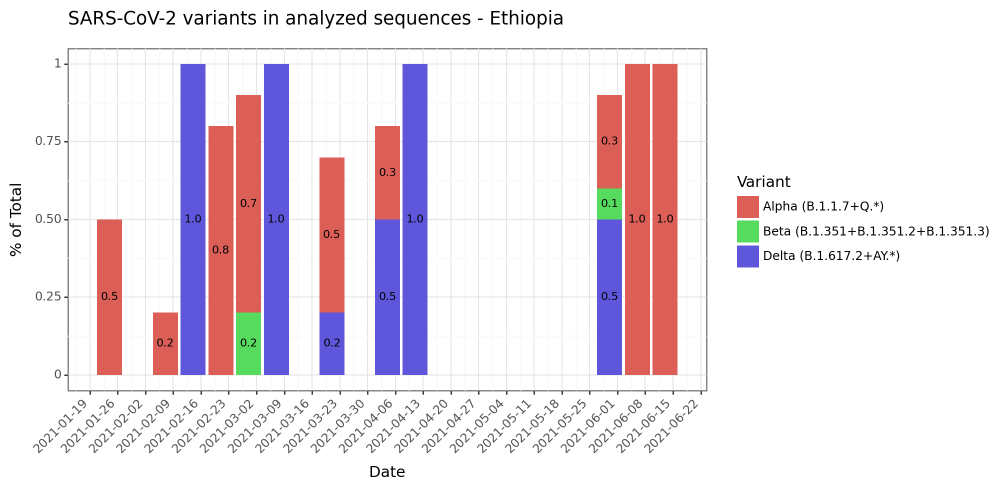


Processing Djibouti in group C. Africa


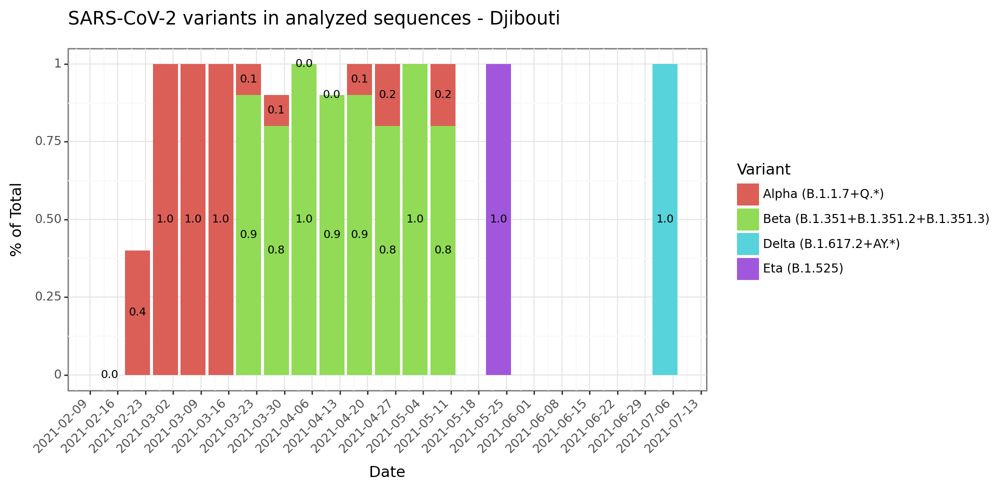


Processing Congo in group C. Africa


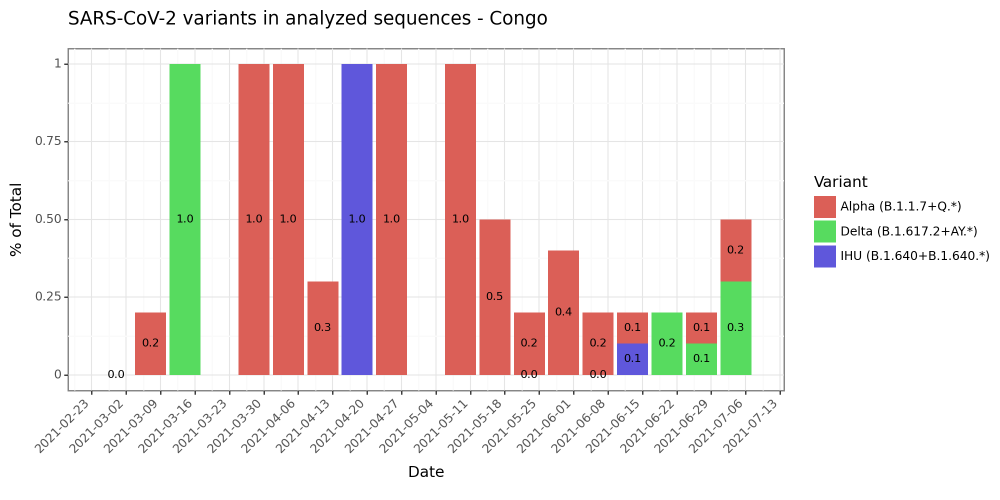


Processing Mali in group C. Africa


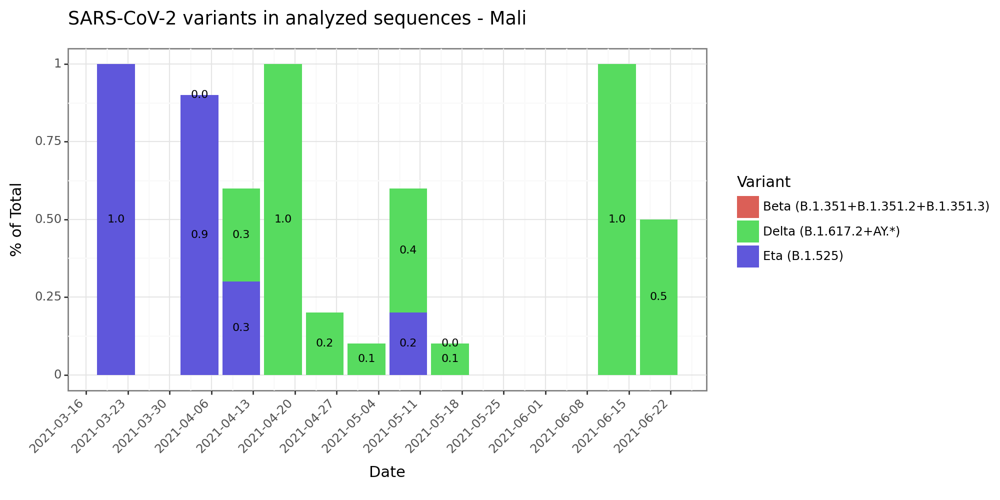


Processing Côte d'Ivoire in group C. Africa


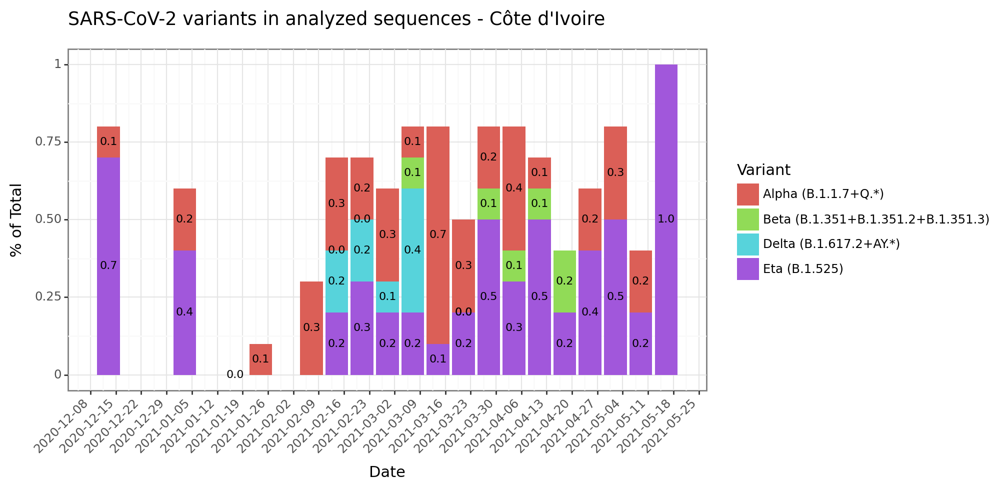


Processing Chad in group C. Africa


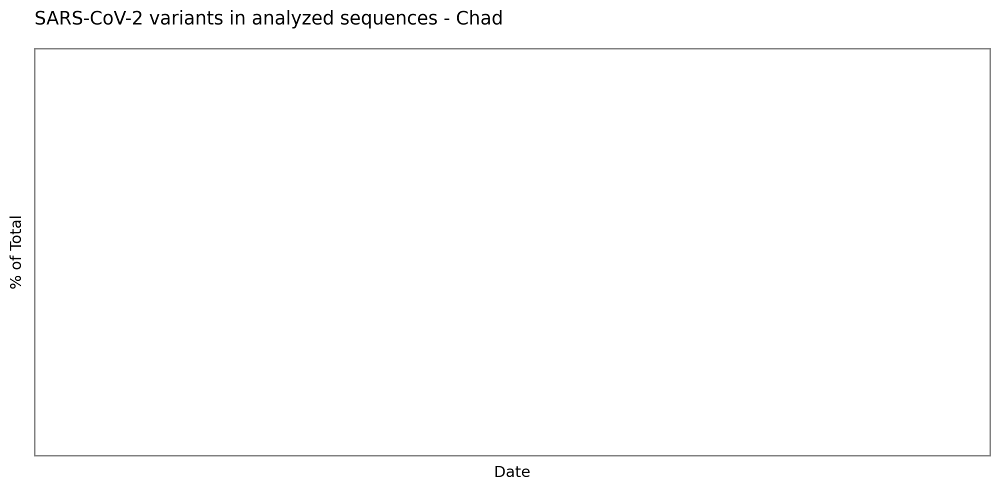


Processing Dem. Rep. Congo in group C. Africa


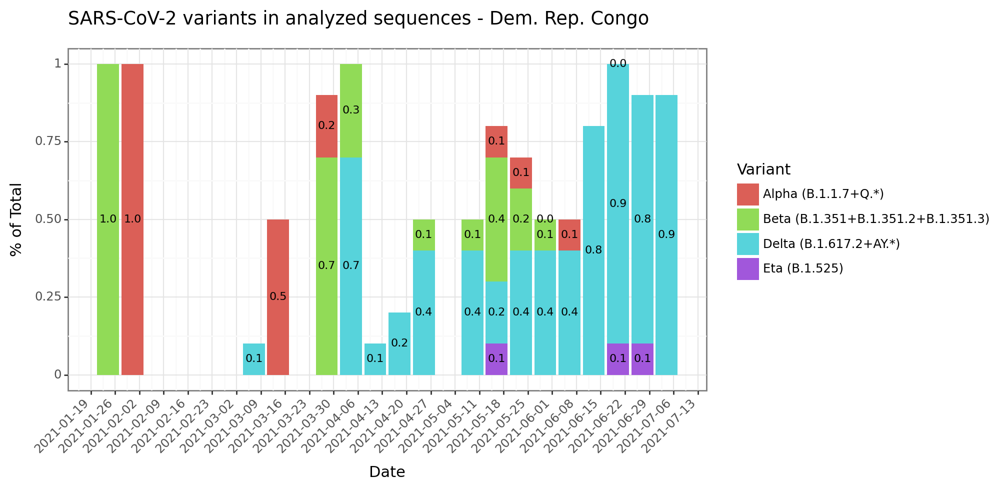


Processing Somalia in group C. Africa


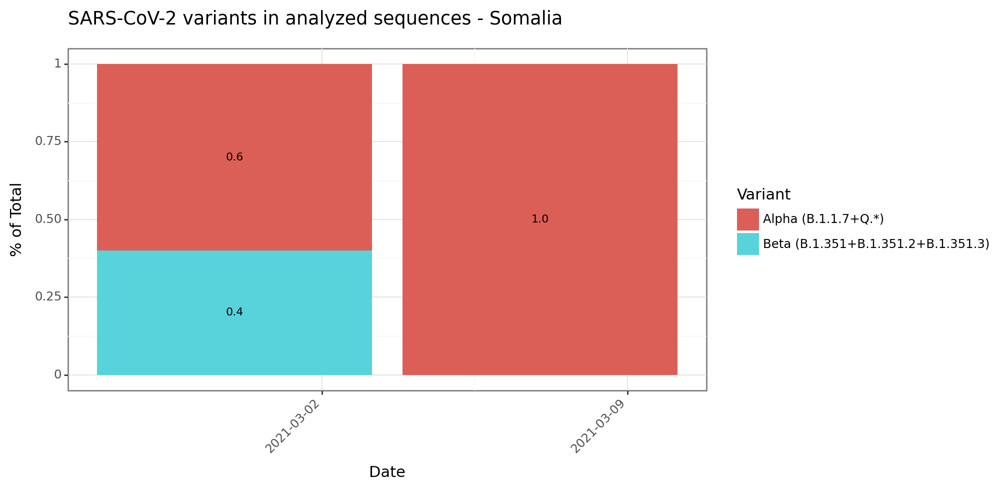


Processing Kenya in group C. Africa


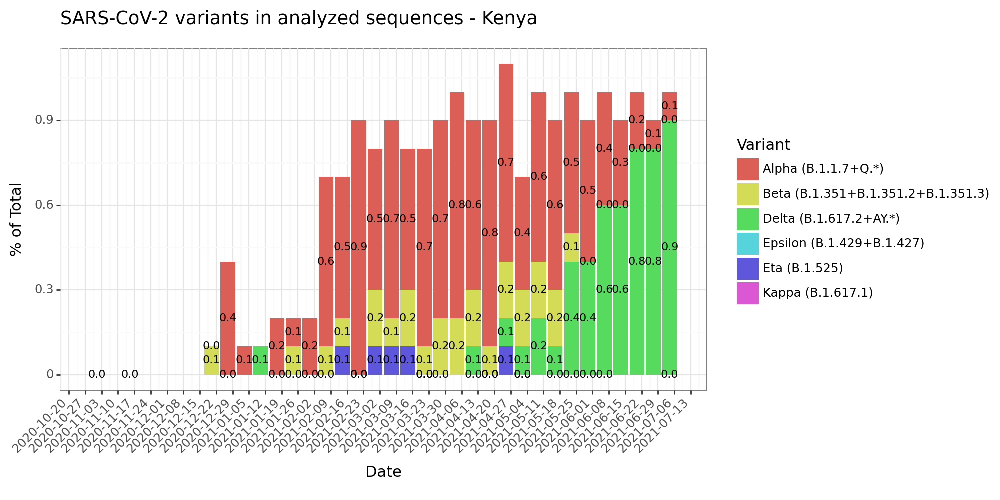


Processing Sudan in group C. Africa


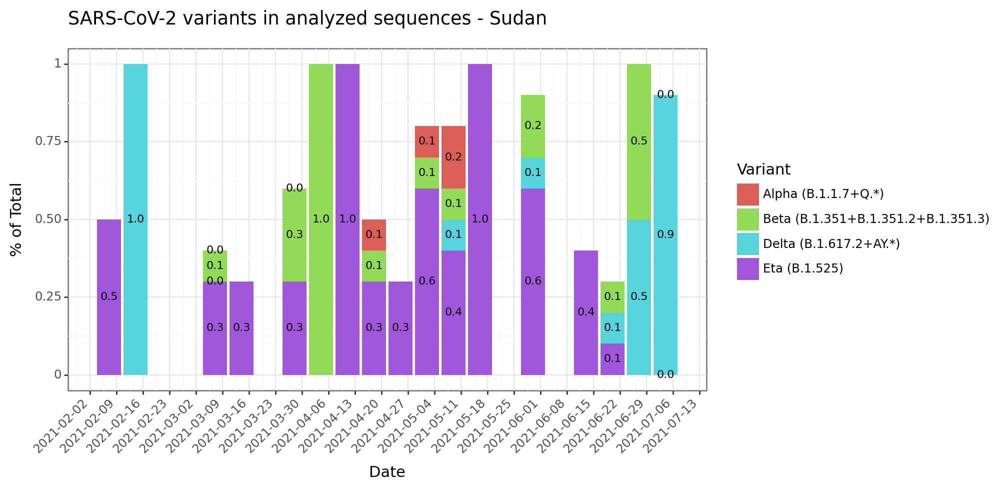


Processing Senegal in group C. Africa


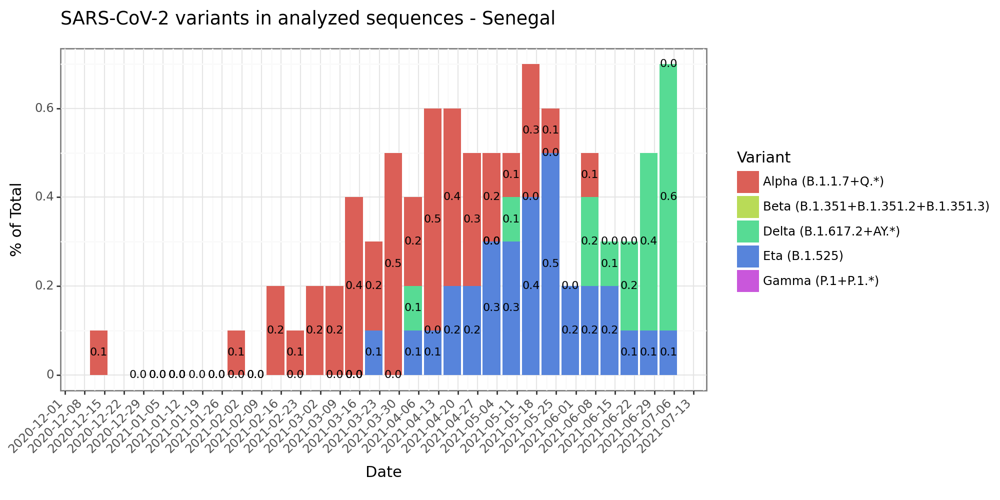


Processing Rwanda in group C. Africa


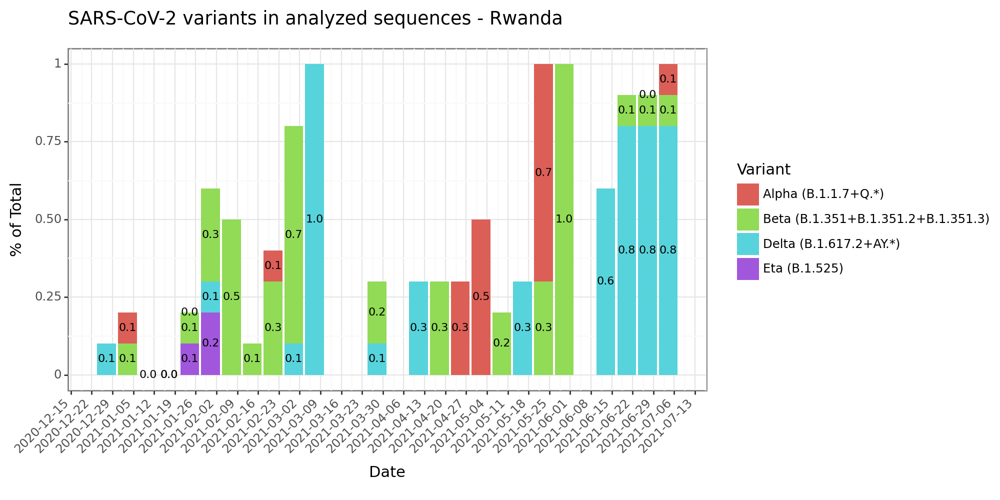


Processing Zimbabwe in group C. Africa


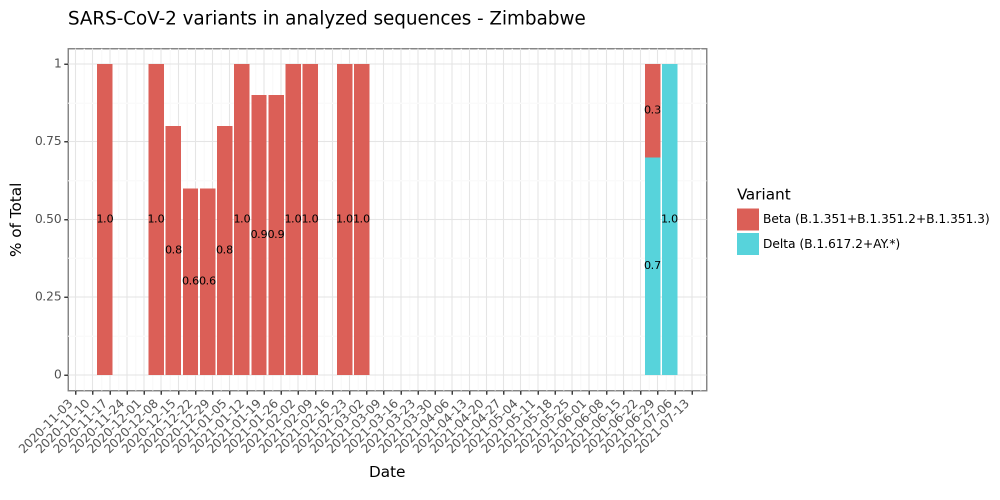


Processing Guyana in group C. America


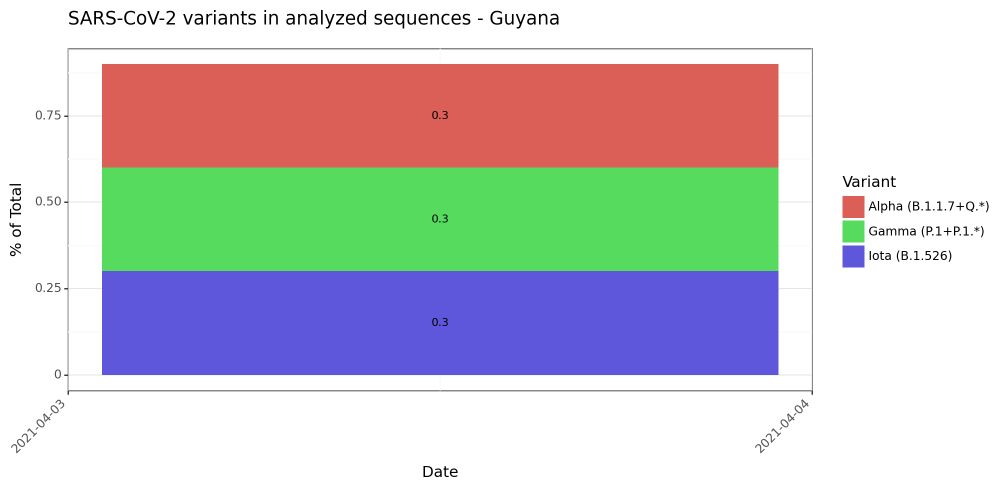


Processing Ecuador in group C. America


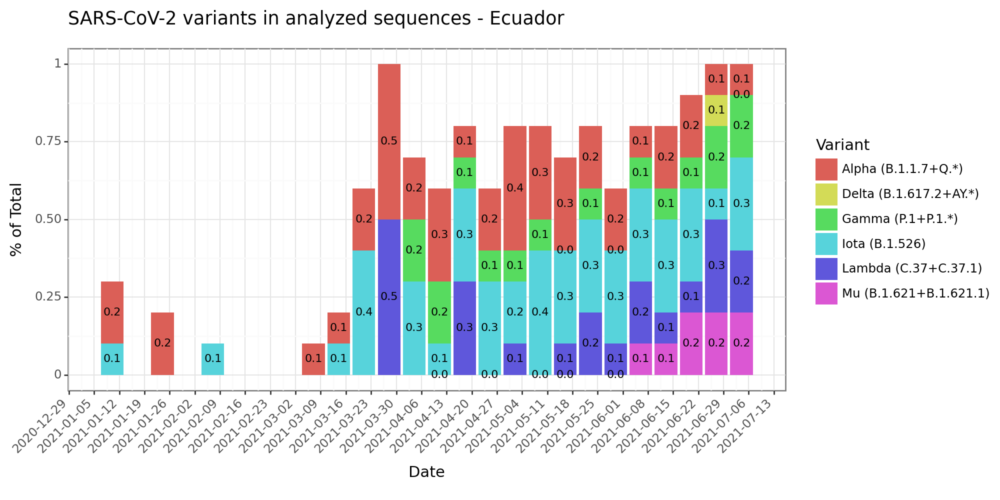


Processing Suriname in group C. America


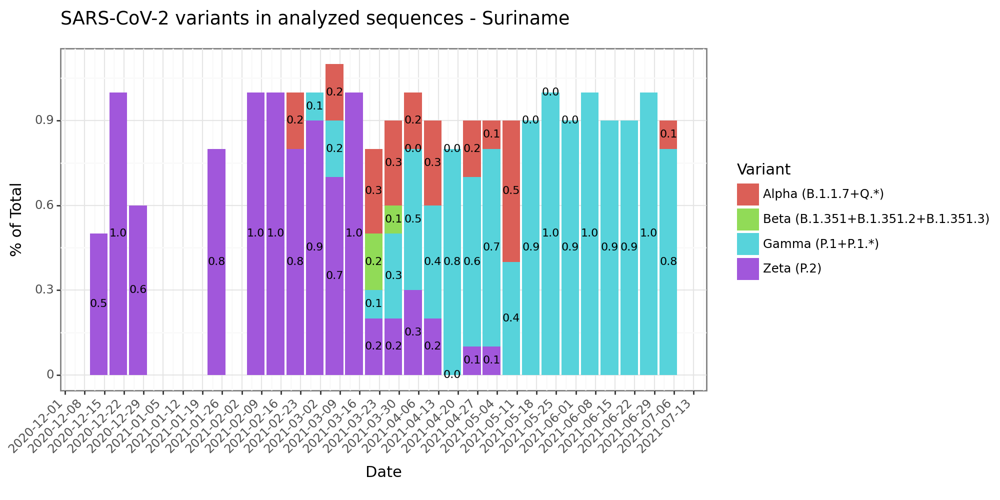


Processing Brazil in group C. America


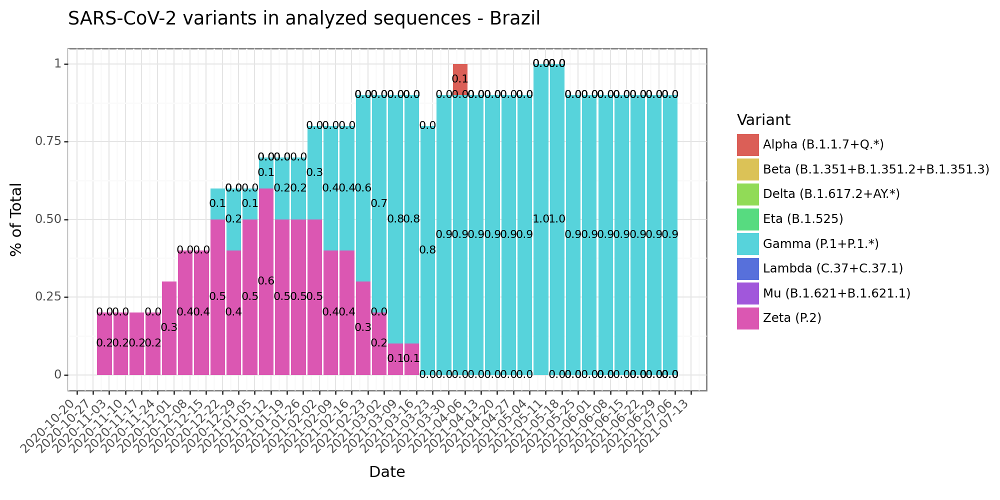


Processing Bolivia in group C. America


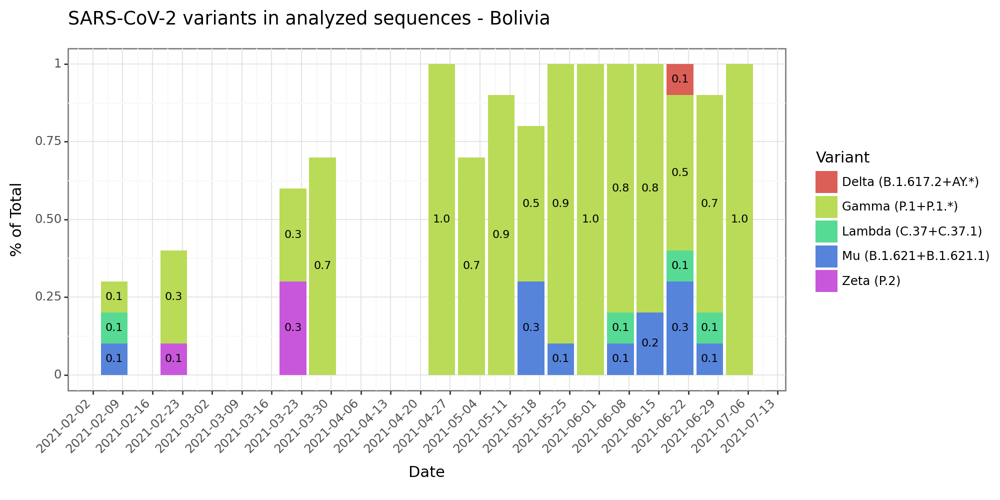


Processing Peru in group C. America


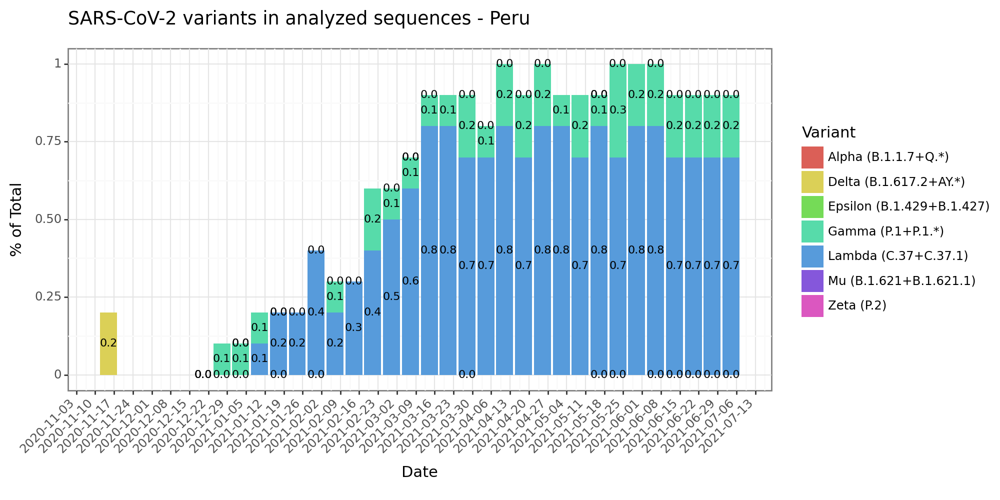


Processing Colombia in group C. America


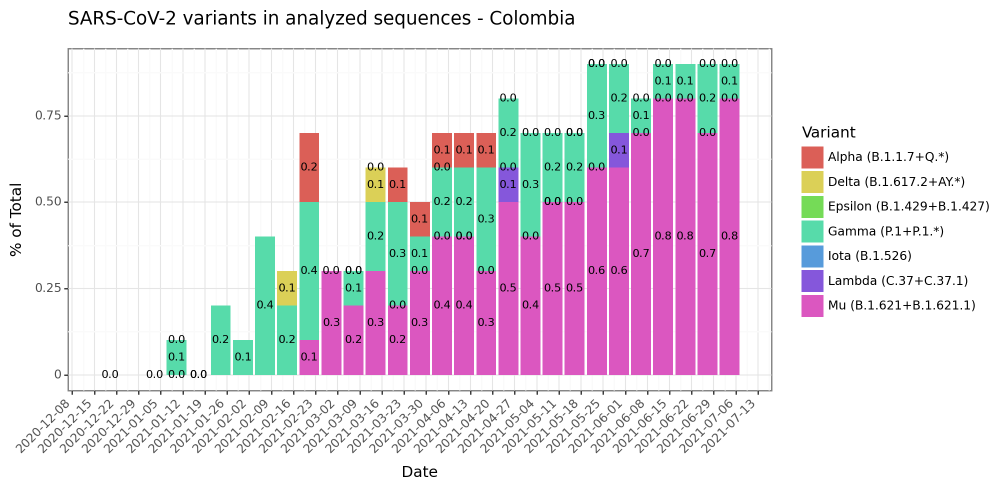


Processing Venezuela in group C. America


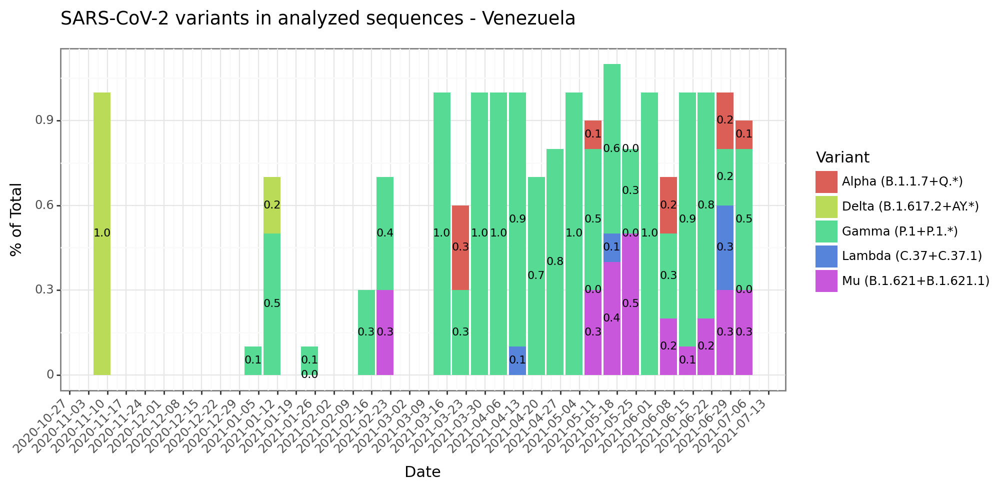


Processing Costa Rica in group C. America


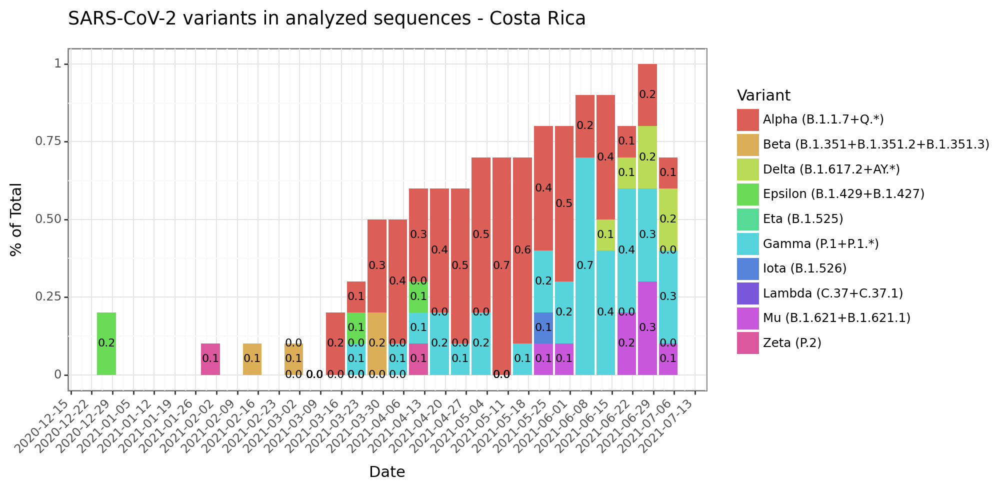


Processing Nicaragua in group C. America


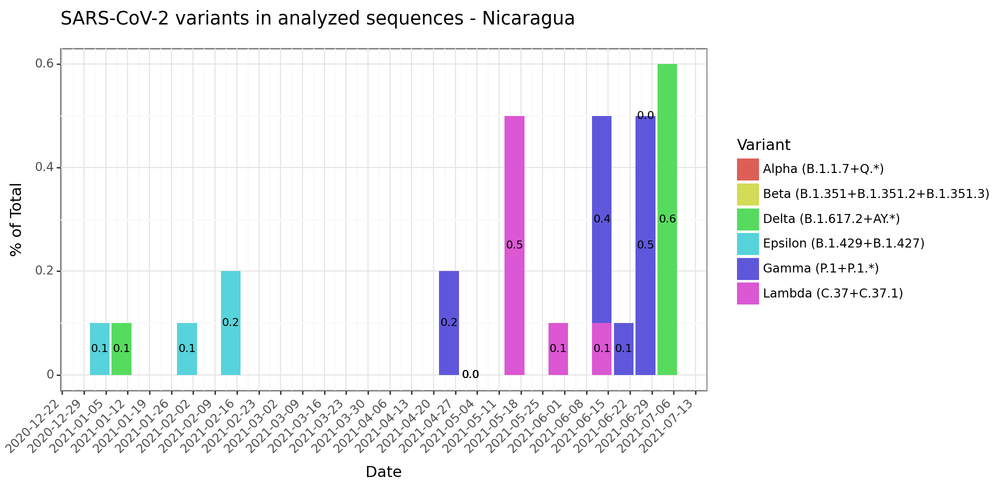


Processing Honduras in group C. America


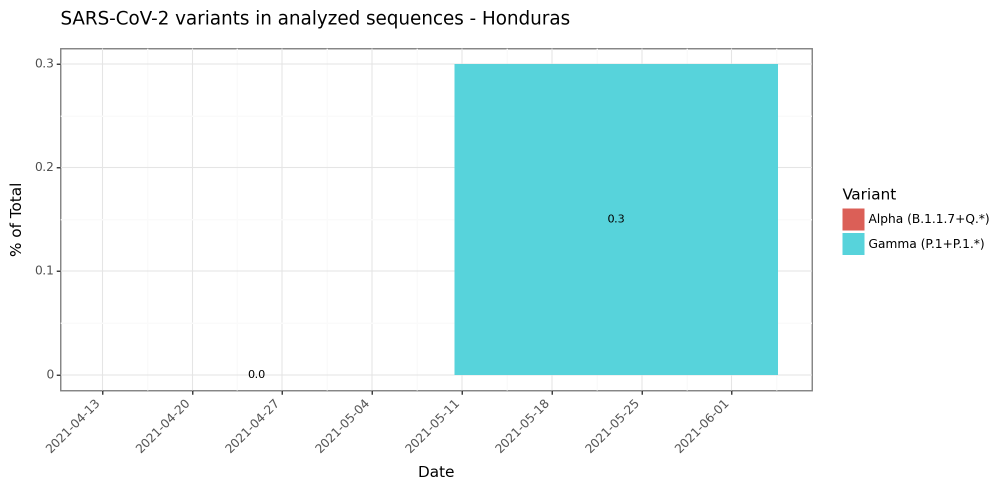


Processing El Salvador in group C. America


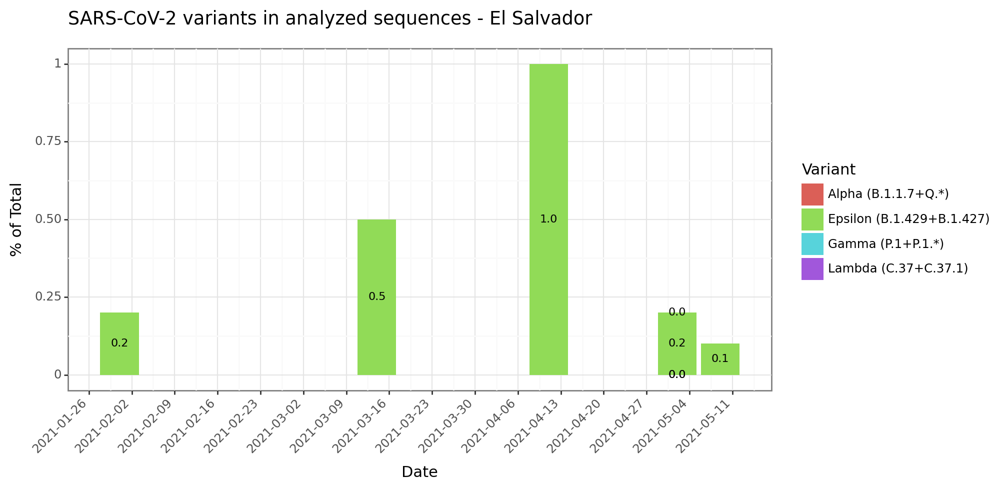


Processing Panama in group C. America


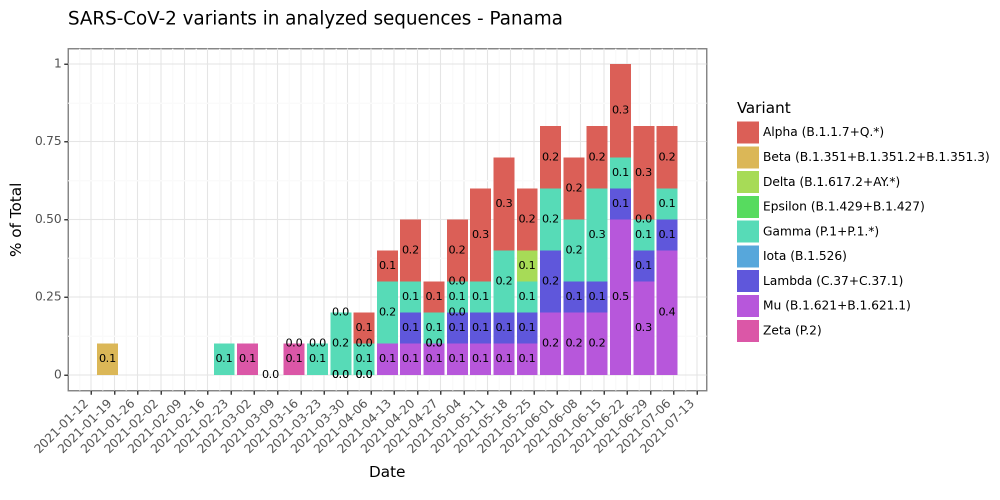


Processing Guatemala in group C. America


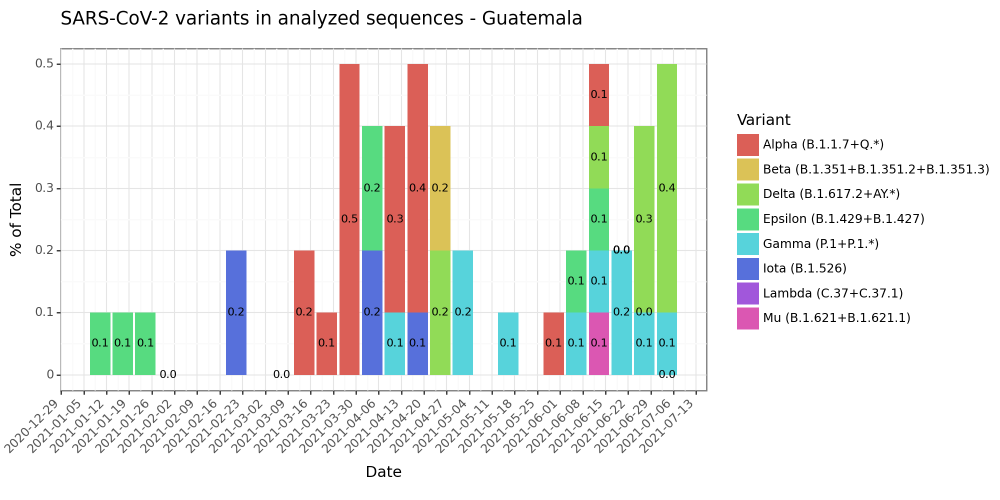


Processing Belize in group C. America


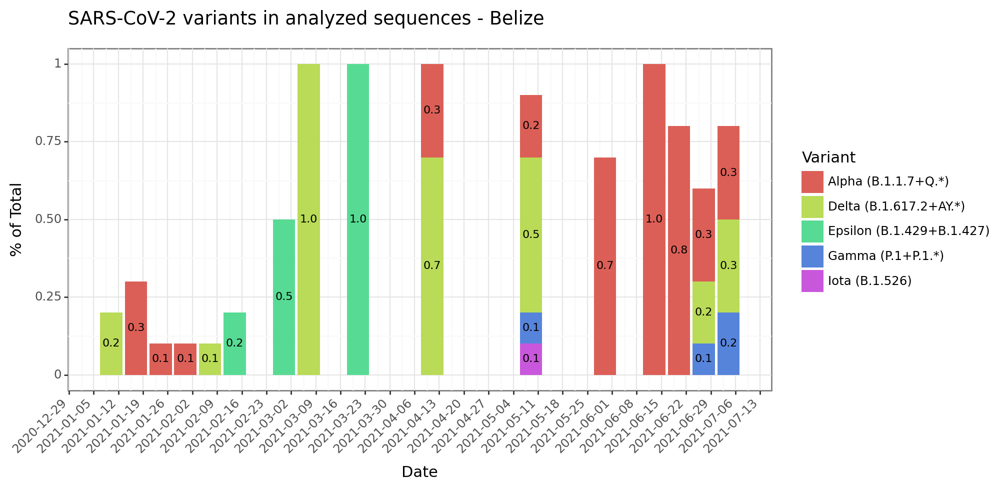


Processing Canada in group Canada


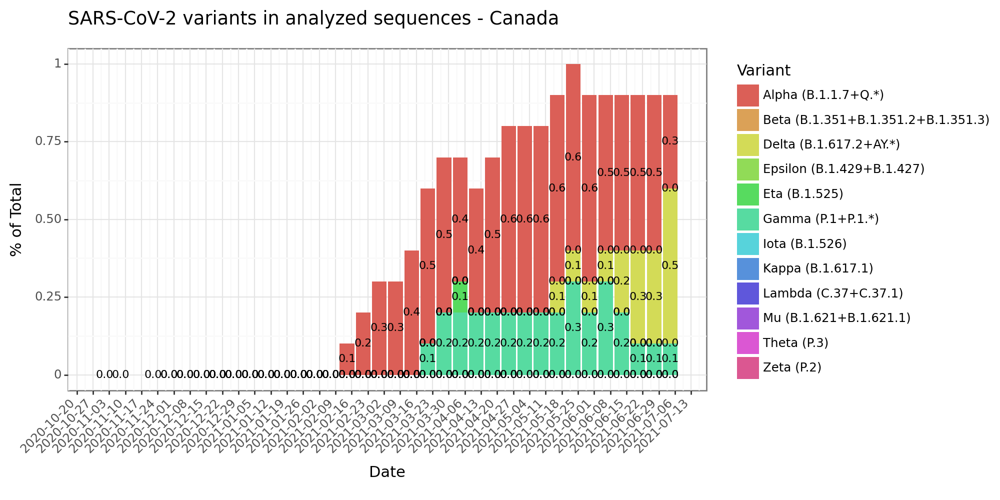


Processing United Kingdom in group N.W. Europe


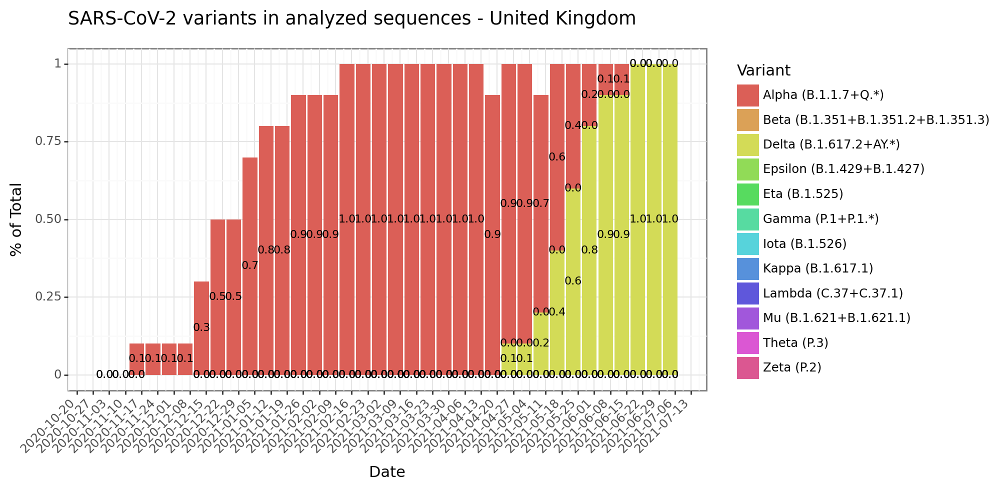


Processing Ireland in group N.W. Europe


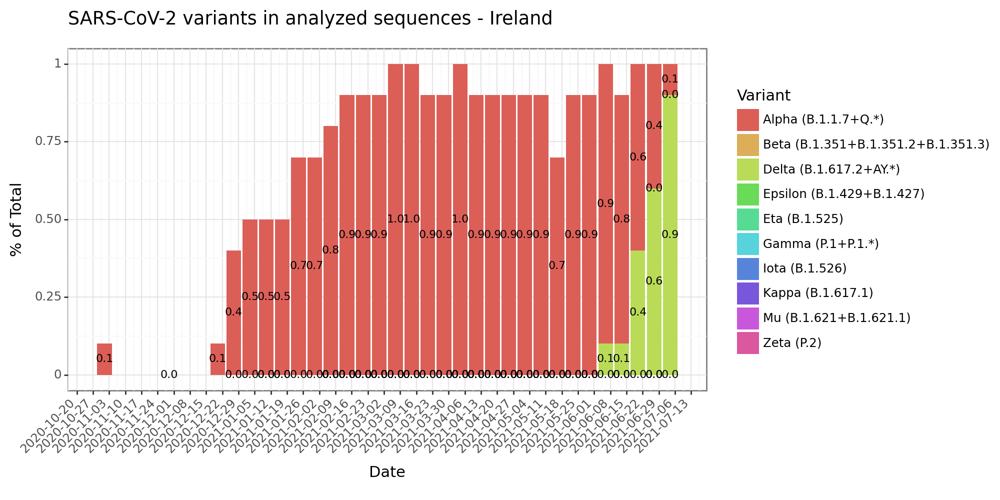


Processing Netherlands in group N.W. Europe


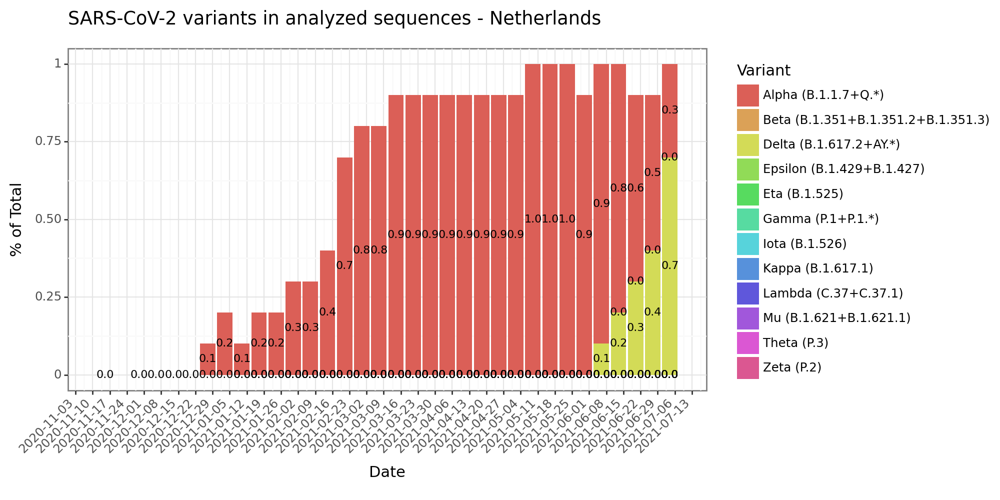


Processing Belgium in group N.W. Europe


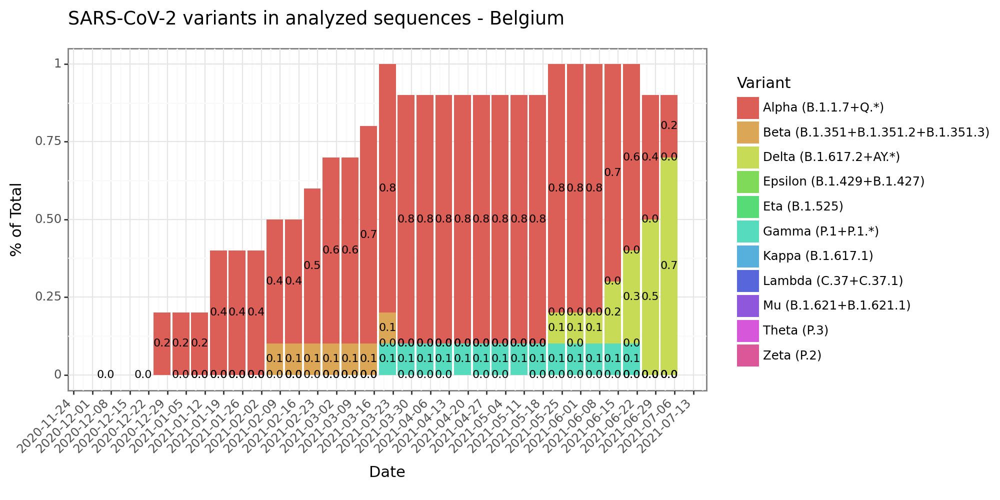


Processing Switzerland in group N.W. Europe


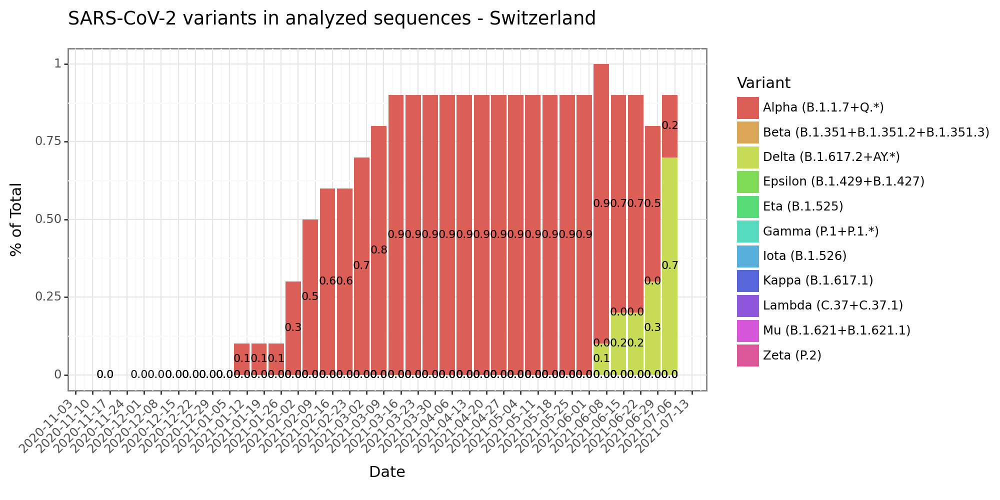


Processing Luxembourg in group N.W. Europe


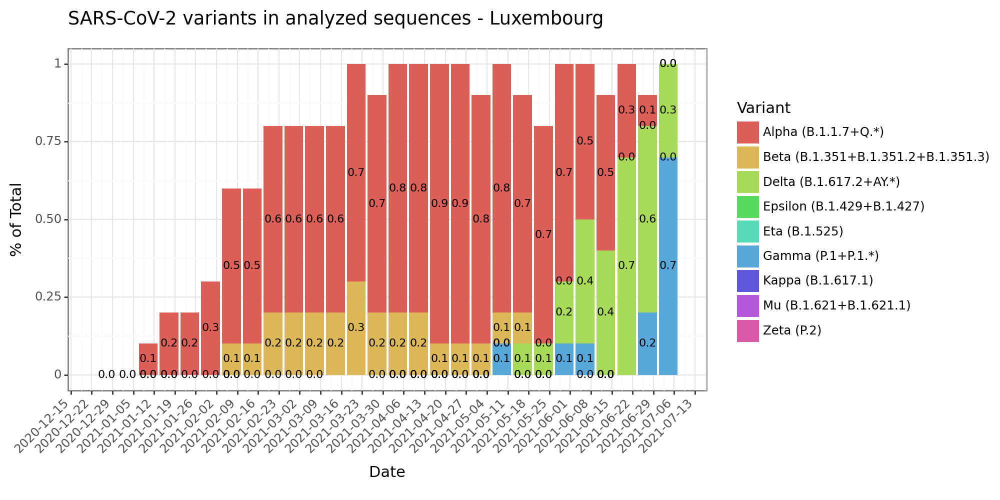


Processing Austria in group N.W. Europe


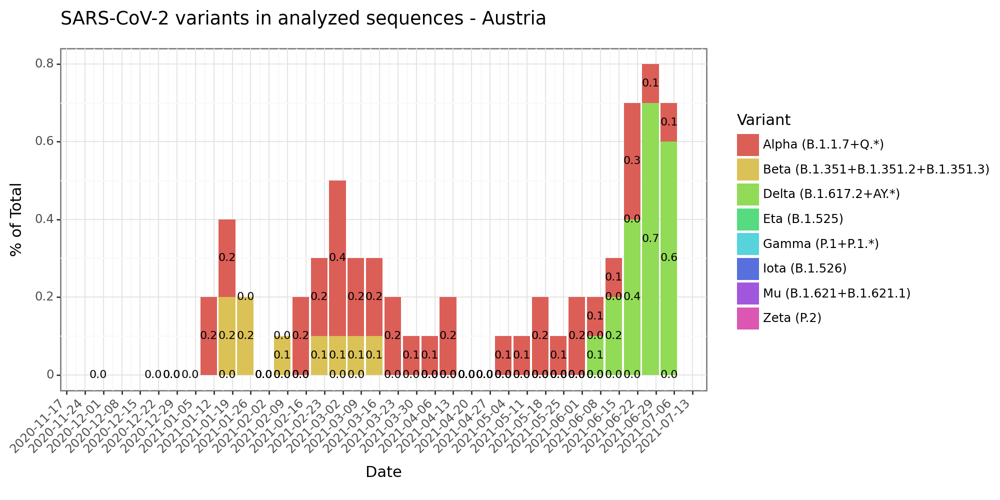


Processing Germany in group N.W. Europe


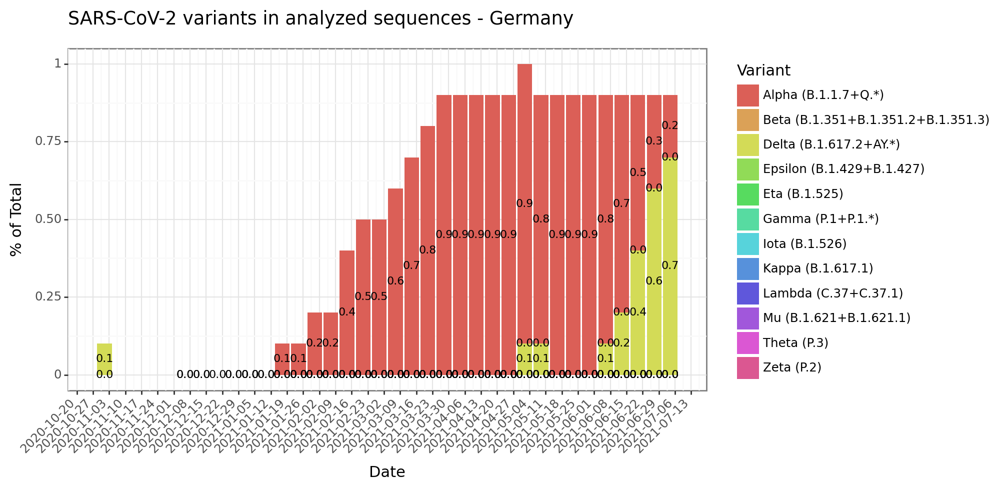


Processing New Zealand in group Oceania


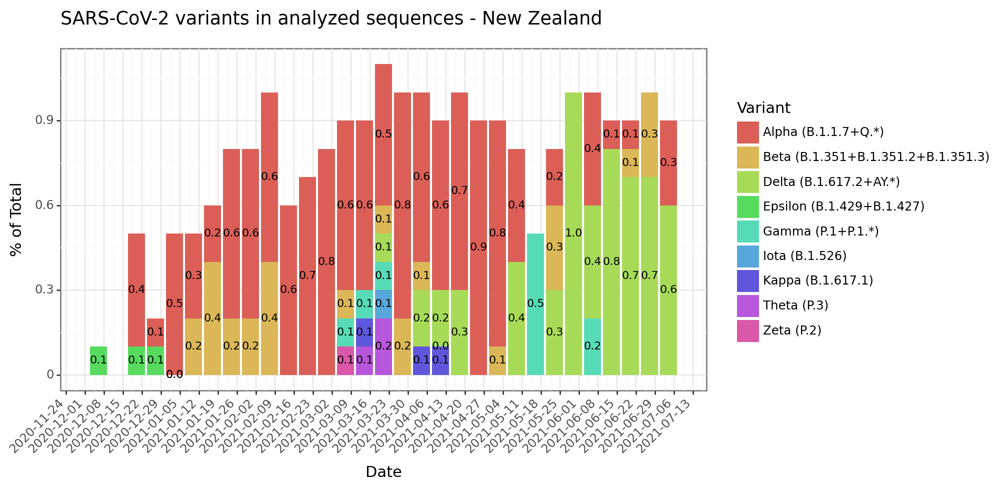


Processing Australia in group Oceania


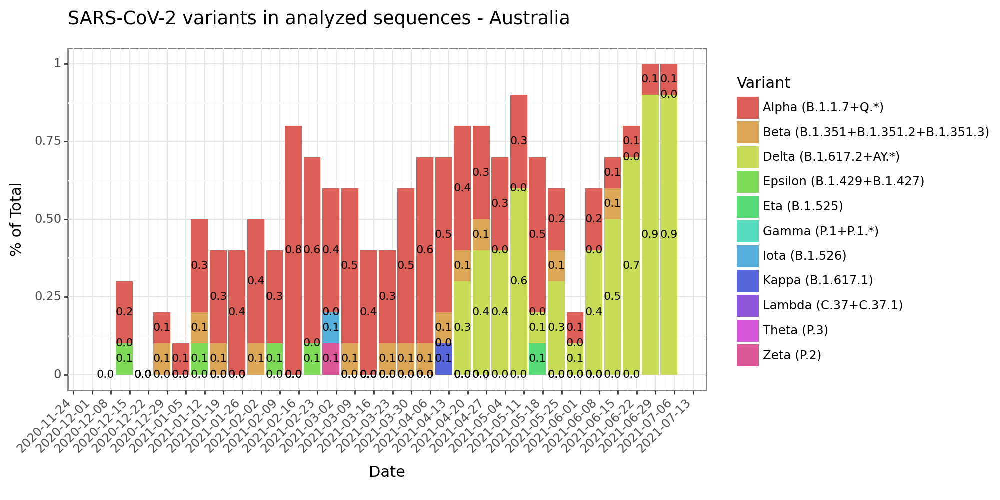


Processing New Caledonia in group Oceania


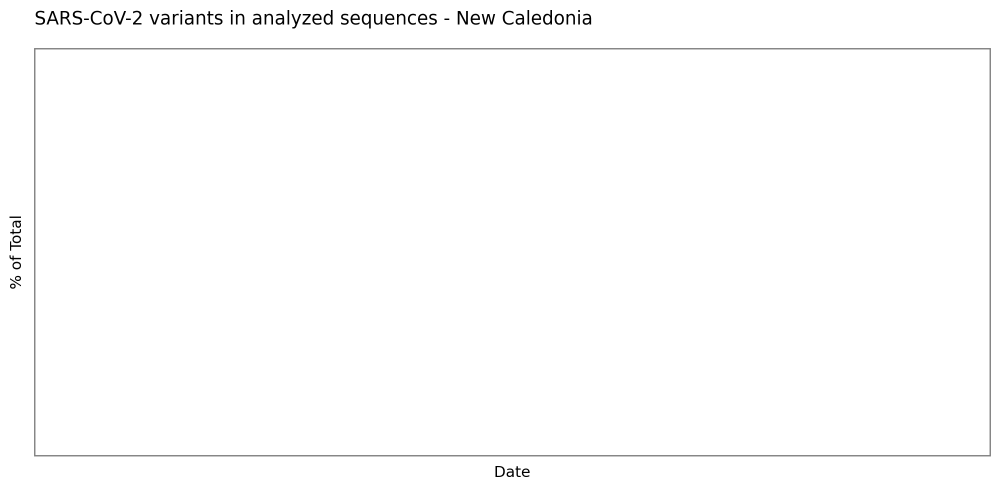


Processing Russia in group Russia


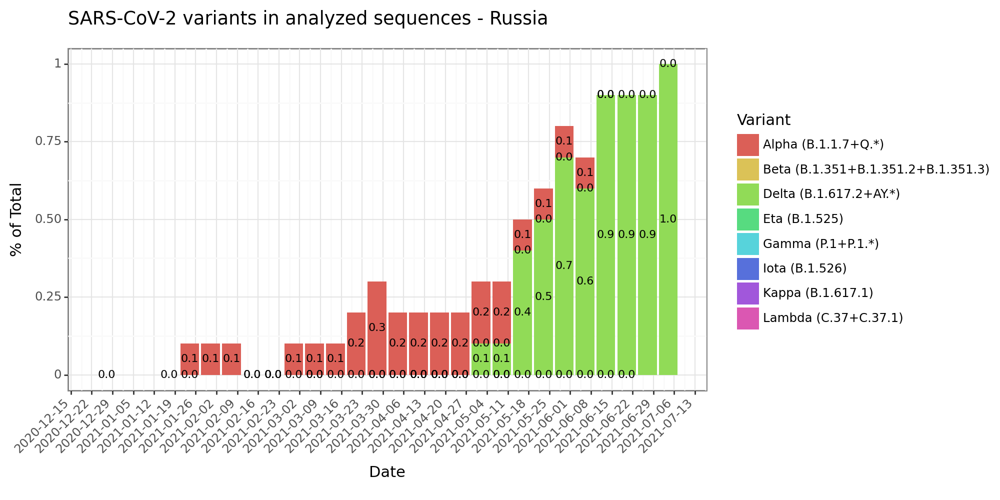


Processing eSwatini in group S. Africa


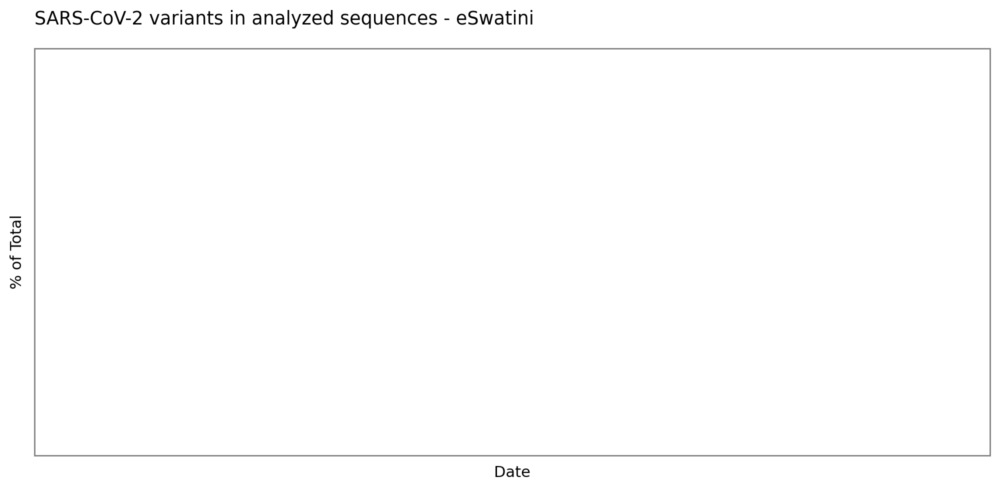


Processing Botswana in group S. Africa


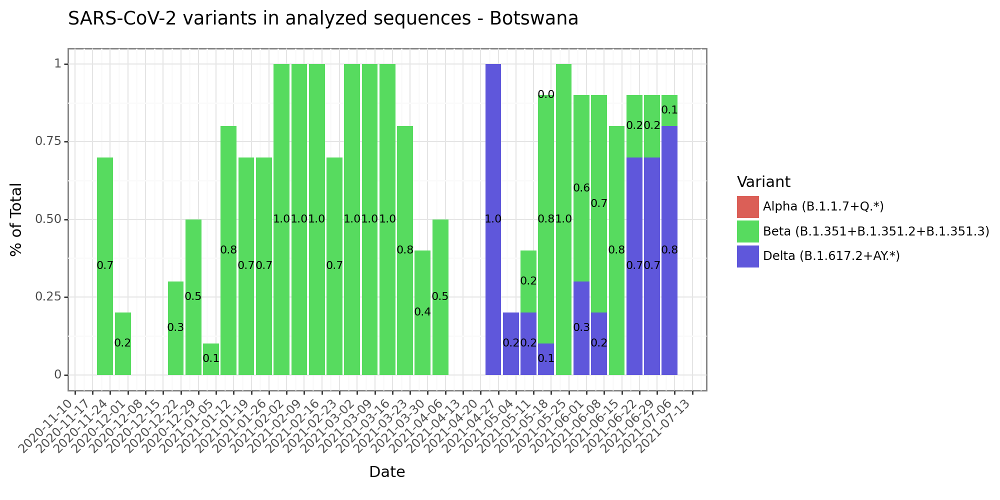


Processing South Africa in group S. Africa


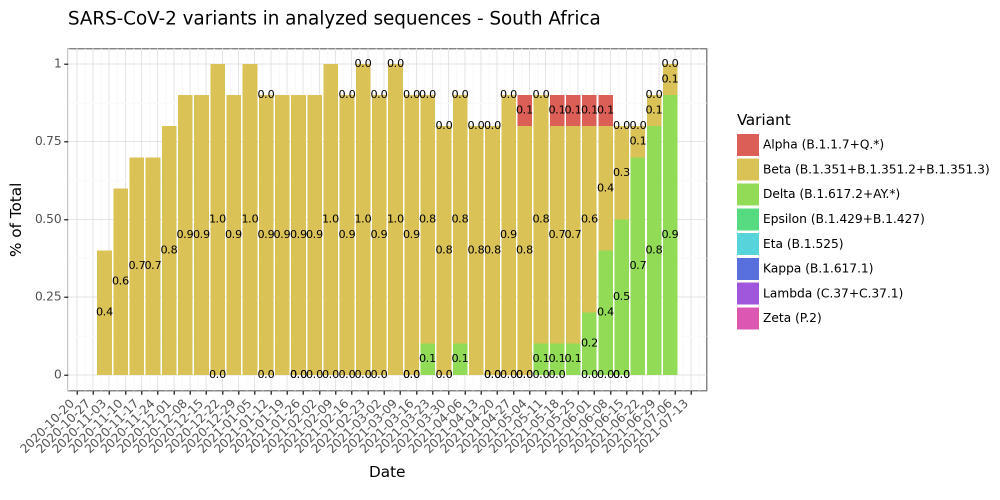


Processing Namibia in group S. Africa


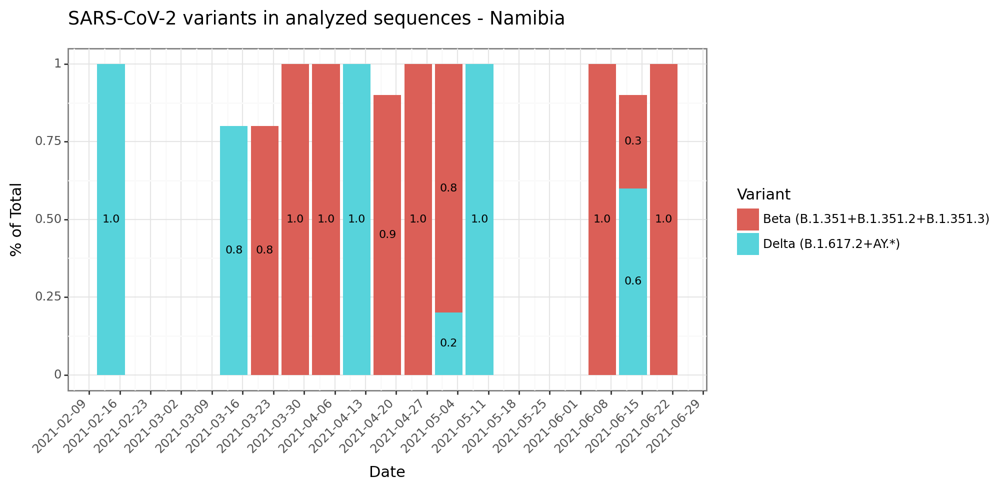


Processing Chile in group S. America


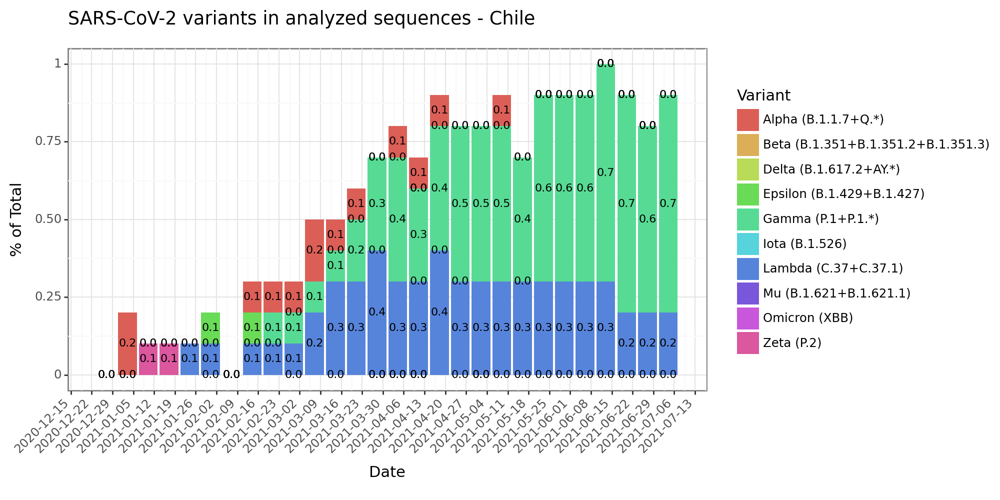


Processing Paraguay in group S. America


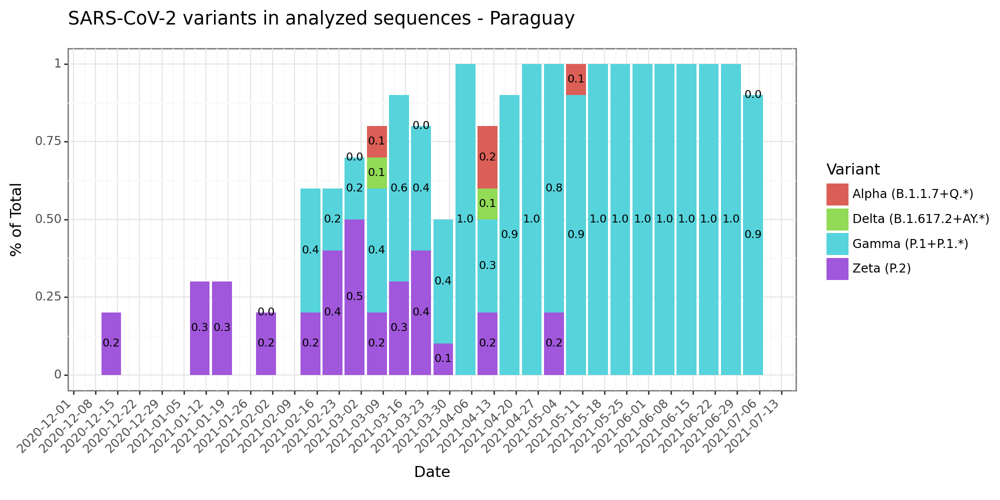


Processing Argentina in group S. America


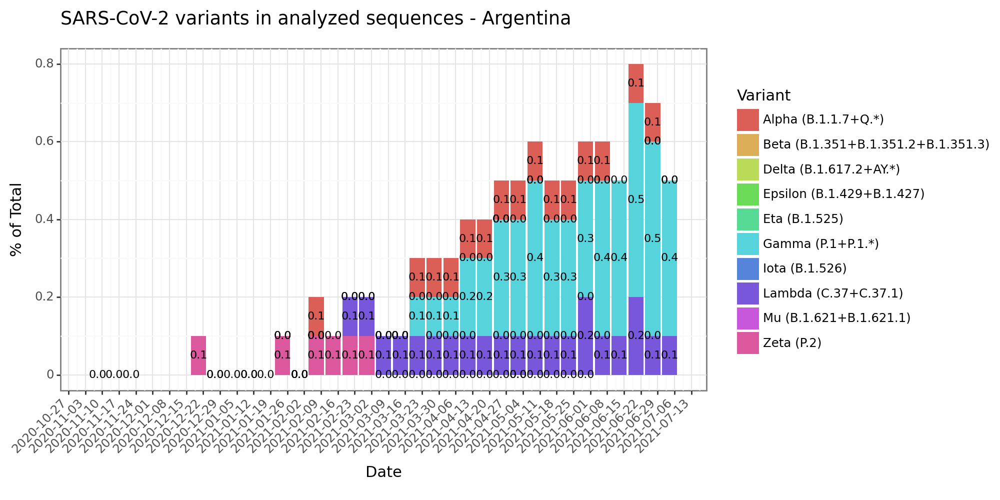


Processing Uruguay in group S. America


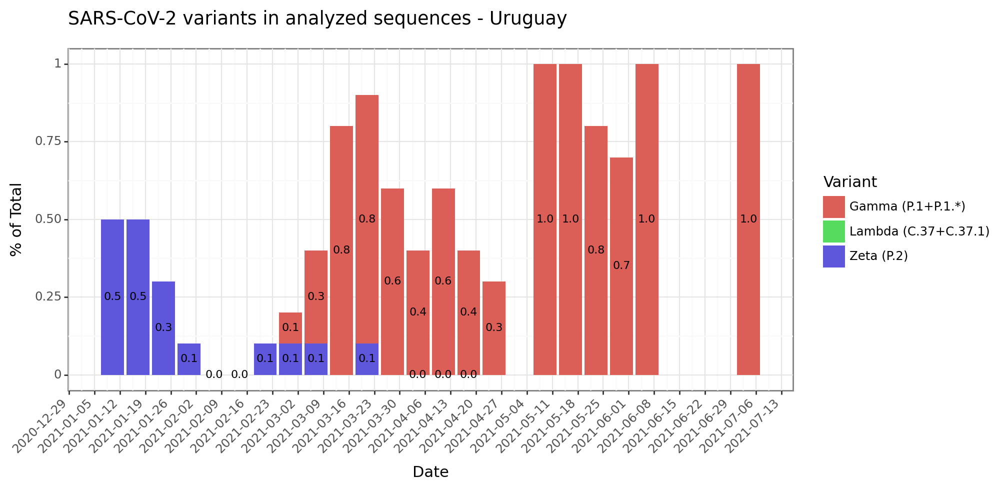


Processing Spain in group S.W. Europe


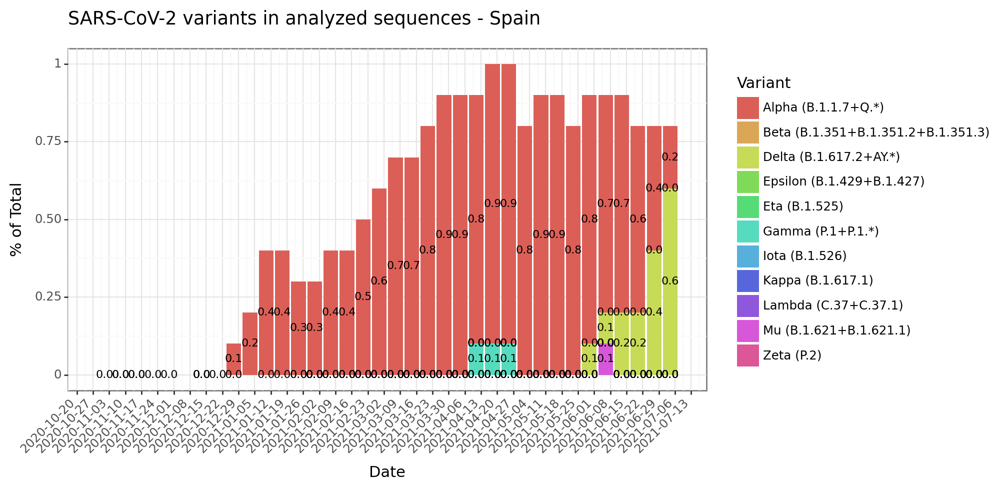


Processing Portugal in group S.W. Europe


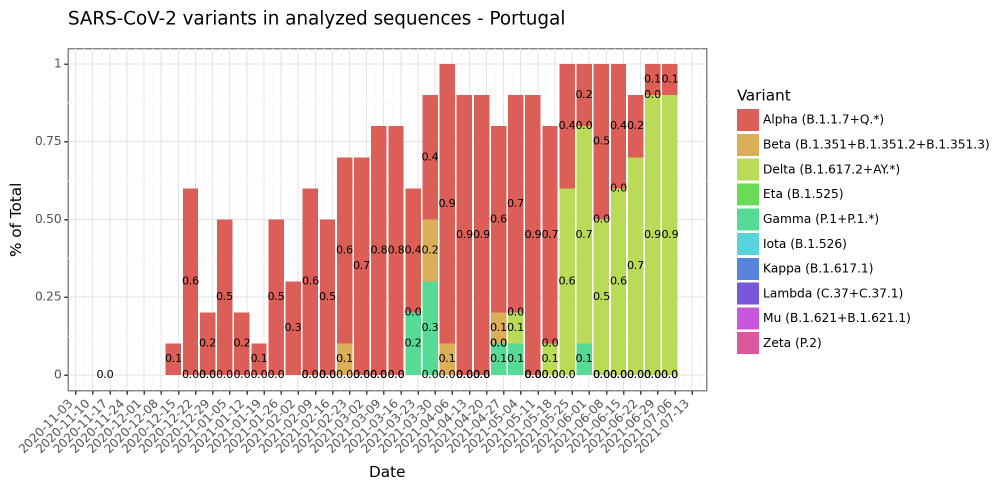


Processing Italy in group S.W. Europe


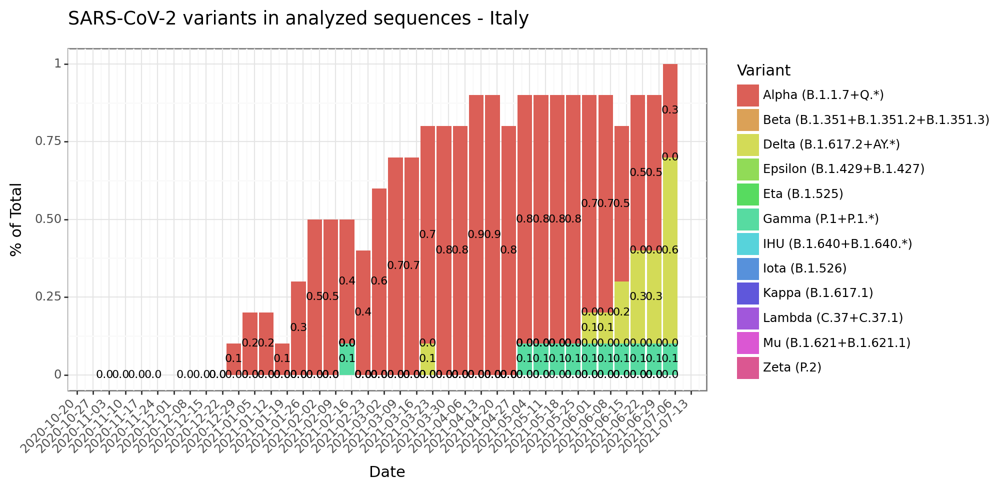


Processing France in group S.W. Europe


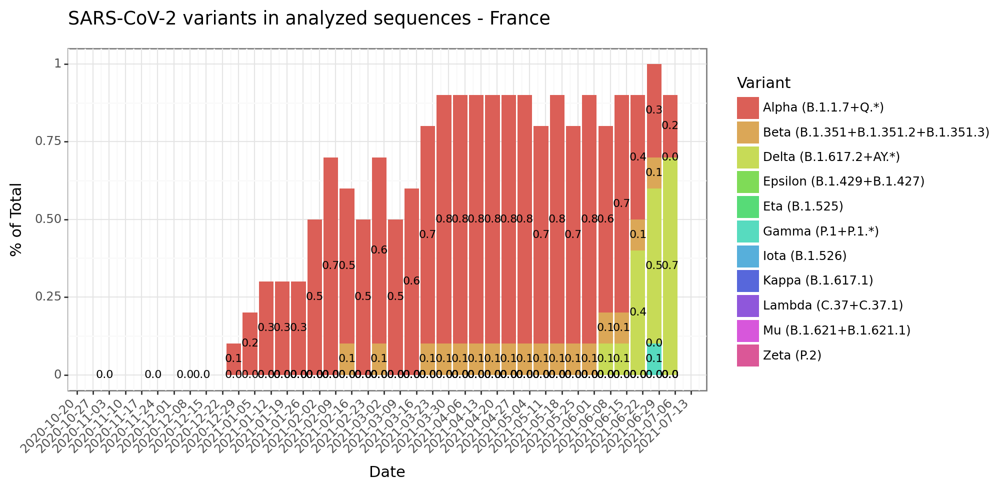

In [23]:
country_groups = pd.read_csv('../data/country_groups.csv').sort_values('group')

# Filter the DataFrame to exclude rows where 'Value' is 'Other'
selected_variants_df = variants_df[variants_df['Value'] != 'Other'].merge(country_to_iso)

selected_variants_df['Week prior to'] = pd.to_datetime(selected_variants_df['Week prior to'])


# Round the '% per Country and Week' column to 1 decimal place
selected_variants_df['% per Country and Week'] = selected_variants_df['% per Country and Week'].round(1)

# Plotting
for country in country_groups['country'].unique():
    country_df = selected_variants_df[selected_variants_df['country'] == country]

    print(f"Processing {country} in group {country_groups[country_groups['country'] == country]['group'].iloc[0]}")
    
    # Create the plot for the current country
    f_t = (p9.ggplot(country_df)
           + p9.aes(x='Week prior to', y='% per Country and Week', fill='Value')
           + p9.geom_bar(stat='identity')
           + p9.geom_text(p9.aes(label='% per Country and Week'), position=p9.position_stack(vjust=0.5), size=8)    
           + p9.scale_x_datetime(date_breaks='1 week')
           + p9.theme_bw()
           + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
           + p9.labs(title=f'SARS-CoV-2 variants in analyzed sequences - {country}', x='Date', y='% of Total', fill='Variant')
           + p9.theme(figure_size=(10, 5))
           + p9.theme(legend_position='right')
          )
    
    print(f_t)
